# Parameter sensitvity
In this notebook, we test the sensitivity of the impact of the CPP scheme to some of its parameters. At first, all parameter changes are considered together. For more detailed investigation see the later sections, where each parameter is considered separately.

In [1]:
from enstools.io import read
from enstools.plot import contour
from matplotlib.dates import DateFormatter
import matplotlib.pyplot as plt
import matplotlib as mpl
import glob
import pandas as pd
import xarray as xr
import numpy as np
import dask
import seaborn as sns
import logging
import cartopy.crs as ccrs
import cartopy.feature as cf
from tqdm import tqdm
from misc_functions import my_contour
from misc_functions import get_radar_mask
from misc_functions import get_prec_time
from misc_functions import compute_theta_v
from misc_functions import get_color_and_lw
from misc_functions import get_data
from misc_functions import get_prec_data, plot_prec_fields
#dfdf
homedir = '/home/m/M.Hirt/'


plt.style.use(['seaborn-colorblind', '/home/m/M.Hirt/poster.mplstyle'])
#matplotlib widget
logger = logging.getLogger()
logger.setLevel(logging.INFO)



In [2]:
import warnings
warnings.filterwarnings("ignore")

#plt.rcParams['figure.figsize'] = [5,5]

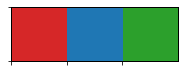

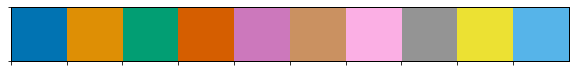

In [3]:
current_palette = sns.color_palette('tab10')
grid_colors =[ current_palette[i] for i in [3,0,2]]
secondary_colors= sns.color_palette('colorblind')#[sns.color_palette('deep')[i] for i in [3,9,8,2,1,0,4,6,7]]

sns.palplot(grid_colors)
sns.palplot(secondary_colors)

## Consider all parameters at once

Here, the parameter sensitivity plots are made. 

In [4]:
from misc_functions import get_prec_data, plot_prec_fields
date='20160605'

run_list =  ['reference',
             
             'cpp2.17_tanh_a2.0_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a0.9_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             
             'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01000.0',
             'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h02000.0',
             'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h02500.0',
             
             'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau100.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau150.0_dh500.0_h01500.0',
             #'cpp2.17_tanh_a0.3_wmax0.6_kref38_theta1.5_sso50.0_tau30.0_dh500.0_h01500.0', 
             #'cpp2.17_tanh_a2.0_wmax0.6_kref38_theta1.5_sso50.0_tau200.0_dh500.0_h01500.0',
             #'cpp2.17_tanh_a3.0_wmax0.6_kref38_theta1.5_sso50.0_tau300.0_dh500.0_h01500.0',
             #'cpp2.17_tanh_a6.0_wmax0.6_kref38_theta1.5_sso50.0_tau600.0_dh500.0_h01500.0',
             
             'cpp2.17_tanh_a1.2_wmax0.3_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a1.2_wmax0.5_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a1.2_wmax0.7_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             
             'radar']


prec_arrays = get_prec_data(run_names = run_list, date = date)
radar_mask = get_radar_mask(date=date, use_time_dependent=False)   

100%|██████████| 16/16 [01:24<00:00,  4.16s/it]


In [5]:

prec_arrays

<xarray.Dataset>
Dimensions:                                                                      (rlat: 461, rlon: 421, time: 24)
Coordinates:
  * time                                                                         (time) datetime64[ns] 2016-06-05T01:00:00 ... 2016-06-06
    rotated_pole                                                                 |S1 b''
  * rlon                                                                         (rlon) float32 -5.0 ... 5.5
  * rlat                                                                         (rlat) float32 -5.0 ... 6.5
    lon                                                                          (rlat, rlon) float32 2.9758525 ... 19.840677
    lat                                                                          (rlat, rlon) float32 44.76518 ... 56.137974
    height_2m                                                                    float32 2.0
    height_10m                                                     

In [6]:
prec_arrays['cpp_default'] = prec_arrays['cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0']
prec_arrays

<xarray.Dataset>
Dimensions:                                                                      (rlat: 461, rlon: 421, time: 24)
Coordinates:
  * time                                                                         (time) datetime64[ns] 2016-06-05T01:00:00 ... 2016-06-06
    rotated_pole                                                                 |S1 b''
  * rlon                                                                         (rlon) float32 -5.0 ... 5.5
  * rlat                                                                         (rlat) float32 -5.0 ... 6.5
    lon                                                                          (rlat, rlon) float32 2.9758525 ... 19.840677
    lat                                                                          (rlat, rlon) float32 44.76518 ... 56.137974
    height_2m                                                                    float32 2.0
    height_10m                                                     

In [7]:
prec_arrays[r'$\alpha$=1.2'] = prec_arrays['cpp_default']
prec_arrays = prec_arrays.rename({'cpp2.17_tanh_a0.9_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0':r'$\alpha$=0.9'})
prec_arrays = prec_arrays.rename({'cpp2.17_tanh_a2.0_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0':r'$\alpha$=2'})

prec_arrays = prec_arrays.rename({'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01000.0':r'$H_0$=1000'})
prec_arrays = prec_arrays.rename({'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0':r'$H_0$=1500'})
prec_arrays = prec_arrays.rename({'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h02000.0':r'$H_0$=2000'})
prec_arrays = prec_arrays.rename({'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h02500.0':r'$H_0$=2500'})

prec_arrays = prec_arrays.rename({'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau100.0_dh500.0_h01500.0':r'$\tau$=100'})
prec_arrays[r'$\tau$=120'] = prec_arrays['cpp_default']
prec_arrays = prec_arrays.rename({'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau150.0_dh500.0_h01500.0':r'$\tau$=150'})

prec_arrays = prec_arrays.rename({'cpp2.17_tanh_a1.2_wmax0.3_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0':r'$w_{max}$=0.3'})
prec_arrays = prec_arrays.rename({'cpp2.17_tanh_a1.2_wmax0.5_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0':r'$w_{max}$=0.5'})
#prec_arrays = prec_arrays.rename({'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0':'wmax0.6'})
prec_arrays[r'$w_{max}$=0.6']=prec_arrays['cpp_default']
prec_arrays = prec_arrays.rename({'cpp2.17_tanh_a1.2_wmax0.7_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0':r'$w_{max}$=0.7'})


prec_arrays


<xarray.Dataset>
Dimensions:        (rlat: 461, rlon: 421, time: 24)
Coordinates:
  * time           (time) datetime64[ns] 2016-06-05T01:00:00 ... 2016-06-06
    rotated_pole   |S1 b''
  * rlon           (rlon) float32 -5.0 -4.975 -4.95 -4.925 ... 5.45 5.475 5.5
  * rlat           (rlat) float32 -5.0 -4.975 -4.95 -4.925 ... 6.45 6.475 6.5
    lon            (rlat, rlon) float32 2.9758525 3.0107758 ... 19.840677
    lat            (rlat, rlon) float32 44.76518 44.767513 ... 56.137974
    height_2m      float32 2.0
    height_10m     float32 10.0
    height_toa     float32 22000.0
    wbt_13c        float32 1.3
Data variables:
    reference      (time, rlat, rlon) float32 0.0 2.514567e-13 ... 0.0 0.0
    $\alpha$=2     (time, rlat, rlon) float32 0.0 2.514567e-13 ... 0.0 0.0
    $H_0$=1500     (time, rlat, rlon) float32 0.0 2.514567e-13 ... 0.0 0.0
    $\alpha$=0.9   (time, rlat, rlon) float32 0.0 2.514567e-13 ... 0.0 0.0
    $H_0$=1000     (time, rlat, rlon) float32 0.0 2.514567e-13 ... 

In [13]:
run_list =['radar','reference',
           r'$\alpha$=0.9',r'$\alpha$=1.2', r'$\alpha$=2',
           r'$\tau$=100', r'$\tau$=120', r'$\tau$=150', 
           r'$H_0$=1000',r'$H_0$=1500',r'$H_0$=2000',r'$H_0$=2500', 
           r'$w_{max}$=0.3', r'$w_{max}$=0.5', r'$w_{max}$=0.6', r'$w_{max}$=0.7']

In [9]:
from matplotlib import colors


### precipitation plot

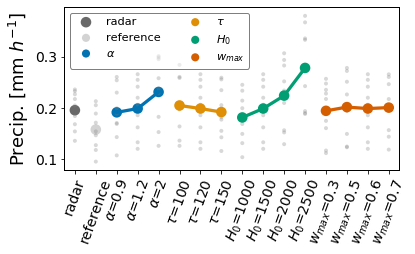

In [15]:
egg = prec_arrays.where(radar_mask).isel(time=slice(11,20)).mean(['rlat', 'rlon']).drop(['height_2m','height_10m', 'wbt_13c', 'height_toa'])
egg = egg.to_array()
egg.name ='precipitation'
df = egg.to_dataframe().stack().reset_index()
df = df.rename(columns={'variable':'run_type', 0:'precipitation'})
df.time = df.time.dt.hour
df['test_param']=[r'$H_0$' if 'H_0' in run else r'$\tau$' if 'tau' in run  else r'$w_{max}$' if 'w_{max}' in run else r'$\alpha$' if 'alpha' in run else run for run in df.run_type]
refrad_runs =  ['reference', 'radar']
cols, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
from matplotlib import colors
cols = [colors.to_rgba(cols[0]),colors.to_rgba(cols[1])]
cols.extend(secondary_colors)

plt.figure(figsize=[6,3])

run_list_param=['radar', 'reference', r'$\alpha$', r'$\tau$', r'$H_0$', r'$w_{max}$']
sns.pointplot(x = 'run_type', y = 'precipitation', data = df,scale=1.2, order=run_list, hue='test_param', 
              estimator=np.mean,ci=None,capsize=.3,
              dodge=False, hue_order=run_list_param,
           palette=cols) #hue_order=refrad_runs,#legend=False,
     #, size='run_type', sizes= linewidths, size_order =refrad_runs)
    

sns.stripplot(x = 'run_type', y = 'precipitation', data = df, jitter=False,size=4,
            color='grey', order=run_list,alpha=.3)#, size='run_type', sizes= linewidths, size_order =refrad_runs)
    
#leg = plt.legend(loc='lower left' , ncol=2, fontsize=12., bbox_to_anchor=[1.,0.02])
leg = plt.legend(loc='upper left' , ncol=2, fontsize=11.35)
leg.get_frame().set_alpha(0.5)
plt.ylabel(r'Precip. [mm $h^{-1}$]')
plt.xlabel('')
plt.xticks(rotation=70)
plt.savefig('../Figures/Paper/precip_parameter_sensitivity.svg')

### FSS plot

In [20]:
run_list.append('last_test')

In [21]:
from fss_functions import compute_fss

fss_df = compute_fss(selected_run_list=run_list, prec_arrays=prec_arrays.where(radar_mask))#.isel(ens=1))


INFO: Now computing fss
100%|██████████| 24/24 [02:33<00:00,  6.45s/it]


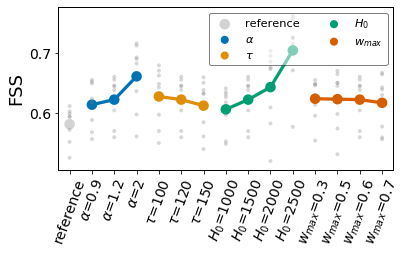

In [23]:
scale = 81
threshold=.1
fss_sel = fss_df[(fss_df.scale==scale) & (fss_df.threshold==threshold) ]

fss_sel = fss_sel.rename(columns={'variable':'run_type', 0:'precipitation'})
fss_sel.time = fss_sel.time.dt.hour
fss_sel = fss_sel[(fss_sel.time>11) & (fss_sel.time<20) & (fss_sel.run !='radar')]
fss_sel['test_param']=[r'$H_0$' if 'H_0' in run else r'$\tau$' if 'tau' in run  else r'$w_{max}$' if 'w_{max}' in run else r'$\alpha$' if 'alpha' in run else run for run in fss_sel.run]


refrad_runs =  ['radar','reference']
cols, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
from matplotlib import colors
cols = [colors.to_rgba(cols[0])]
cols.extend(secondary_colors)

run_list_param=['radar', 'reference', r'$\alpha$',r'$\tau$', r'$H_0$', r'$w_{max}$']


plt.figure(figsize=[6,3])



sns.pointplot(x = 'run', y = 'FSS', data = fss_sel, order=run_list[1:-1], 
            hue='test_param',dodge=False,ci=None, scale=1.2,
            palette=cols) #hue_order=refrad_runs,#legend=False,
     #, size='run_type', sizes= linewidths, size_order =refrad_runs)
    

sns.stripplot(x = 'run', y = 'FSS', data = fss_sel, order=run_list[1:-1], #hue_order=refrad_runs,#legend=False,
            color='grey',alpha=.3, jitter=False,size=4)#, size='run_type', sizes= linewidths, size_order =refrad_runs)
    
leg = plt.legend(loc='upper right' , ncol=2, fontsize=11.35)
leg.get_frame().set_alpha(0.5)
plt.ylabel(r'FSS')
plt.xlabel('')
plt.xticks(rotation=70)
plt.savefig('../Figures/Paper/FSS_parameter_sensitivity.svg')

In [19]:
run_list

['radar',
 'reference',
 '$\\alpha$=0.9',
 '$\\alpha$=1.2',
 '$\\alpha$=2',
 '$\\tau$=100',
 '$\\tau$=120',
 '$\\tau$=150',
 '$H_0$=1000',
 '$H_0$=1500',
 '$H_0$=2000',
 '$H_0$=2500',
 '$w_{max}$=0.3',
 '$w_{max}$=0.5',
 '$w_{max}$=0.6',
 '$w_{max}$=0.7']

### S-SAL plot

In [24]:
from SAL_cosmo_utils import compute_SAL
def compute_SAL2(*args, **kwargs):
    S,_,_,_,_,_,_,_,_,_ = compute_SAL(*args,**kwargs)
    return(S)

kws = dict(user_threshold=None)

fcst = prec_arrays.to_array('run').where(radar_mask)
fcst = xr.where(fcst<0,0,fcst)# negative values are not possible
fcst = fcst.chunk({'time':1, 'run':1})

S_SAL = xr.apply_ufunc(compute_SAL2, prec_arrays['radar'].compute().chunk({'time':1}), fcst,
                     input_core_dims= [['rlat', 'rlon',], ['rlat', 'rlon']],
                     #output_core_dims=[['thresholds','scales']],
                     vectorize=True, 
                     dask = 'parallelized', output_dtypes=[float],# output_sizes = {'thresholds':3,'scales':4}, 
                      kwargs = kws).compute()
S_SAL.name='S-SAL'

In [25]:
S_df = S_SAL.to_dataframe().reset_index().rename(columns={'run':'run_type'})#.fillna(0)
print(S_df.columns)
#S_df = format_parameters(S_df)
S_df.describe()

Index(['time', 'run_type', 'rotated_pole', 'height_2m', 'height_10m',
       'height_toa', 'wbt_13c', 'S-SAL'],
      dtype='object')


,height_2m,height_10m,height_toa,wbt_13c,S-SAL
count,408.0,408.0,408.0,408.000000,402.000000
mean,2.0,10.0,22000.0,1.299995,-1.139933
std,0.0,0.0,0.0,0.000005,0.413181
min,2.0,10.0,22000.0,1.300000,-1.720624
25%,2.0,10.0,22000.0,1.300000,-1.442160
50%,2.0,10.0,22000.0,1.300000,-1.216285
75%,2.0,10.0,22000.0,1.300000,-0.995390
max,2.0,10.0,22000.0,1.300000,0.000000


In [26]:
S_df = S_df.rename(columns={'variable':'run_type', 0:'precipitation'})
S_df.time = S_df.time.dt.hour
S_df = S_df[(S_df.time>11) & (S_df.time<20) & (S_df.run_type !='radar')]

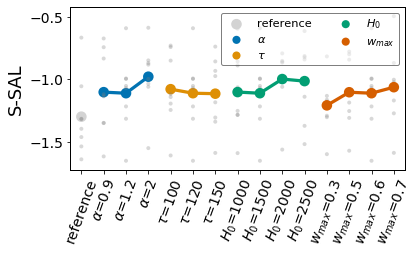

In [27]:

S_df['test_param']=[r'$H_0$' if 'H_0' in run else r'$\tau$' if 'tau' in run  else r'$w_{max}$' if 'w_{max}' in run else r'$\alpha$' if 'alpha' in run else run for run in S_df.run_type]


refrad_runs =  ['radar','reference']
cols, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
from matplotlib import colors
cols = [colors.to_rgba(cols[0])]
cols.extend(secondary_colors)

run_list_param=[ 'reference', r'$\alpha$',  r'$\tau$',r'$H_0$',r'$w_{max}$']


plt.figure(figsize=[6,3])



sns.pointplot(x = 'run_type', y = 'S-SAL', data = S_df, order=run_list[1:-1], 
            hue='test_param',dodge=False,ci=None,hue_order=run_list_param,
            palette=cols,scale=1.2,
             ) #hue_order=refrad_runs,#legend=False,
     #, size='run_type', sizes= linewidths, size_order =refrad_runs)
    

sns.stripplot(x = 'run_type', y = 'S-SAL', data = S_df, order=run_list[1:-1], 
              #hue_order=refrad_runs,#legend=False,
            color='grey',alpha=.3, jitter=False,size=4)#, size='run_type', sizes= linewidths, size_order =refrad_runs)
    
leg = plt.legend(loc='upper right' , ncol=2, fontsize=11.35)
leg.get_frame().set_alpha(0.5)
plt.ylabel(r'S-SAL')
plt.xlabel('')
plt.xticks(rotation=70)
plt.savefig('../Figures/Paper/S-SAL_parameter_sensitivity.svg')

### Cloud radii

In [10]:
from rdf_functions import identify_clouds, identify_clouds_2   
def make_cloud_ds(prec_arrays, radar_mask, water_kws=dict(water=False), prec_thres=(1.0,)):
    egg = prec_arrays.where(radar_mask).compute().to_array(dim='run',name='precipitation').stack(time_run=['time', 'run'])
    labels = egg.groupby('time_run').apply(identify_clouds_2, args =prec_thres, return_var = 'labels', **water_kws)
    cld_size = egg.groupby('time_run').apply(identify_clouds_2, args =prec_thres,return_var='cld_size',**water_kws)
    cld_sum = egg.groupby('time_run').apply(identify_clouds_2, args =prec_thres,return_var='cld_sum', **water_kws)

    cloud_ds=xr.Dataset()
    cloud_ds['labels']= labels
    cloud_ds['cloud_size']= cld_size
    cloud_ds['cloud_sum']= cld_sum
    #cloud_ds = cloud_ds.unstack('time_run')
    cloud_ds = cloud_ds.unstack().rename_dims({'time_run_level_0':'time', 'time_run_level_1':'run'})
    cloud_ds = cloud_ds.rename_vars({'time_run_level_0':'time', 'time_run_level_1':'run'})
    cloud_ds['#_of_clouds'] = (cloud_ds.cloud_size>0).sum('cloud_number')
    cloud_ds['cloud_radius'] = np.sqrt(cloud_ds.cloud_size / np.pi) / 1000  # in km
    cloud_ds.attrs=water_kws
    cloud_ds.attrs['prec_thres'] = 1.0
    return cloud_ds

water_kws= dict(water=False, neighborhood = 3)
prec_thres=(5.0,)
cloud_ds_nonsep = make_cloud_ds(prec_arrays, radar_mask, water_kws=water_kws, prec_thres=prec_thres)

In [11]:


egg = cloud_ds_nonsep[['#_of_clouds']]
egg['median_cloud_radii'] = cloud_ds_nonsep.cloud_radius.median('cloud_number')
egg['mean_cloud_radii'] = cloud_ds_nonsep.cloud_radius.mean('cloud_number')

cloud_df_nonsep = egg.to_dataframe().reset_index()
cloud_df_nonsep = cloud_df_nonsep.rename(columns={'run':'run_type'})
#cloud_df_nonsep = format_parameters(cloud_df_nonsep)
cloud_df_nonsep.describe()

,#_of_clouds,wbt_13c,height_2m,height_toa,height_10m,median_cloud_radii,mean_cloud_radii
count,408.000000,408.000000,408.0,408.0,408.0,402.000000,402.000000
mean,103.708333,1.299995,2.0,22000.0,10.0,2.794757,3.768777
std,72.678963,0.000005,0.0,0.0,0.0,0.696661,0.820264
min,0.000000,1.300000,2.0,22000.0,10.0,1.579731,2.672816
25%,59.000000,1.300000,2.0,22000.0,10.0,2.234077,3.232634
50%,73.000000,1.300000,2.0,22000.0,10.0,2.736174,3.603210
75%,147.000000,1.300000,2.0,22000.0,10.0,3.159462,4.062525
max,280.000000,1.300000,2.0,22000.0,10.0,8.516590,8.516590


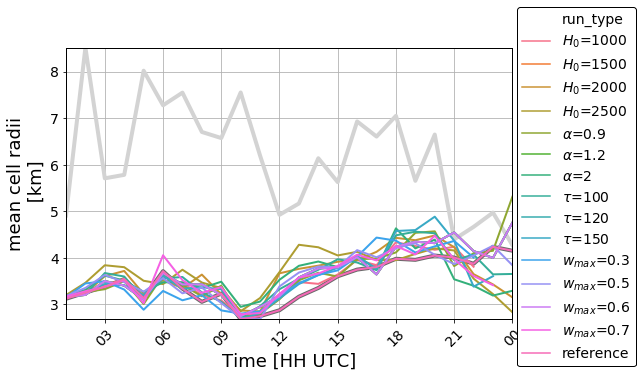

In [33]:
refrad_runs =  ['reference', 'radar']
colors, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
plt.figure(figsize=[8,5])
sns.lineplot(x = 'time', y = 'mean_cloud_radii', hue='run_type', data = cloud_df_nonsep, 
             hue_order=refrad_runs, legend=False,
            palette=colors, size='run_type', sizes= linewidths, size_order =refrad_runs)

sns.lineplot(x = 'time', y = 'mean_cloud_radii',
             #hue='$\\alpha_{cp}$',style='$w_{max} [m s^{-1}]$',
             hue='run_type',
             #style='$w_{max} [m s^{-1}]$',
            #hue='$\\alpha_{cp}$', size ='fixedH',
             data = cloud_df_nonsep[cloud_df_nonsep['run_type'].isin(run_list[1:-1])], 
             #palette=sns.color_palette("colorblind",7),
            linewidth=2,)


#leg = plt.legend(loc='lower left' , ncol=1, fontsize='11.5')
#leg.get_frame().set_alpha(0.8)
leg = plt.legend(bbox_to_anchor=(1.01, 1.15), loc=2, borderaxespad=0.,)
plt.xticks(rotation=45)
#lt.ylabel(r'mediancloud size')
plt.xlabel('Time [HH UTC]')
plt.ylabel('mean cell radii\n [km]')
plt.grid()
plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)


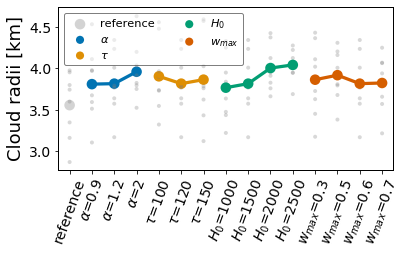

In [31]:
df = cloud_df_nonsep
df = df.rename(columns={'variable':'run_type', 0:'precipitation'})
df.time = df.time.dt.hour
df = df[(df.time>11) & (df.time<20) & (df.run_type !='radar')]
df['test_param']=[r'$H_0$' if 'H_0' in run else r'$\tau$' if 'tau' in run  else r'$w_{max}$' if 'w_{max}' in run else r'$\alpha$' if 'alpha' in run else run for run in df.run_type]
refrad_runs =  ['reference', 'radar']
cols, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
from matplotlib import colors
cols = [colors.to_rgba(cols[1])]
cols.extend(secondary_colors)

plt.figure(figsize=[6,3])

run_list_param=['radar', 'reference', r'$\alpha$', r'$\tau$', r'$H_0$', r'$w_{max}$']
sns.pointplot(x = 'run_type', y = 'mean_cloud_radii', data = df,scale=1.2, order=run_list[1:-1], hue='test_param', 
              estimator=np.mean,ci=None,capsize=.3,
              dodge=False, hue_order=run_list_param[1:],
           palette=cols) #hue_order=refrad_runs,#legend=False,
     #, size='run_type', sizes= linewidths, size_order =refrad_runs)
    

sns.stripplot(x = 'run_type', y = 'mean_cloud_radii', data = df, jitter=False,size=4,
            color='grey', order=run_list[1:-1],alpha=.3)#, size='run_type', sizes= linewidths, size_order =refrad_runs)
    
#leg = plt.legend(loc='lower left' , ncol=2, fontsize=12., bbox_to_anchor=[1.,0.02])
leg = plt.legend(loc='upper left' , ncol=2, fontsize=11.35)
leg.get_frame().set_alpha(0.5)
plt.ylabel(r'Cloud radii [km]')
plt.xlabel('')
plt.xticks(rotation=70)
plt.savefig('../Figures/Paper/cloud_size_parameter_sensitivity.svg')

## Differences with tanh-height distribution

In [4]:
from misc_functions import get_prec_data, plot_prec_fields
date='20160605'

run_list =  ['reference',
             'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01000.0',
             'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h02000.0',
             'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h02500.0',
             'radar']


prec_arrays = get_prec_data(run_names = run_list, date = date)
radar_mask = get_radar_mask(date=date, use_time_dependent=False)   

100%|██████████| 6/6 [00:28<00:00,  4.22s/it]


In [64]:
prec_arrays = prec_arrays.rename({'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01000.0':'CPP H_0=1000'})
prec_arrays = prec_arrays.rename({'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0':'CPP H_0=1500'})
prec_arrays = prec_arrays.rename({'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h02000.0':'CPP H_0=2000'})
prec_arrays = prec_arrays.rename({'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h02500.0':'CPP H_0=2500'})
prec_arrays
run_list =['reference', 'radar','CPP H_0=1000','CPP H_0=1500','CPP H_0=2000','CPP H_0=2500']

<xarray.Dataset>
Dimensions:       (rlat: 461, rlon: 421, time: 24)
Coordinates:
  * time          (time) datetime64[ns] 2016-06-05T01:00:00 ... 2016-06-06
    rotated_pole  |S1 b''
  * rlon          (rlon) float32 -5.0 -4.975 -4.95 -4.925 ... 5.45 5.475 5.5
  * rlat          (rlat) float32 -5.0 -4.975 -4.95 -4.925 ... 6.45 6.475 6.5
    lon           (rlat, rlon) float32 2.9758525 3.0107758 ... 19.840677
    lat           (rlat, rlon) float32 44.76518 44.767513 ... 56.137974
    height_2m     float32 2.0
    height_10m    float32 10.0
    height_toa    float32 22000.0
    wbt_13c       float32 1.3
Data variables:
    reference     (time, rlat, rlon) float32 0.0 2.514567e-13 ... 0.0 0.0
    CPP H_0=1000  (time, rlat, rlon) float32 0.0 2.514567e-13 ... nan nan
    CPP H_0=1500  (time, rlat, rlon) float32 0.0 2.514567e-13 ... 0.0 0.0
    CPP H_0=2000  (time, rlat, rlon) float32 0.0 2.514567e-13 ... 0.0 0.0
    CPP H_0=2500  (time, rlat, rlon) float32 0.0 2.514567e-13 ... 0.0 0.0
    rada

In [96]:
run_list =['reference', 'radar','CPP H_0=1000','CPP H_0=1500','CPP H_0=2000','CPP H_0=2500']

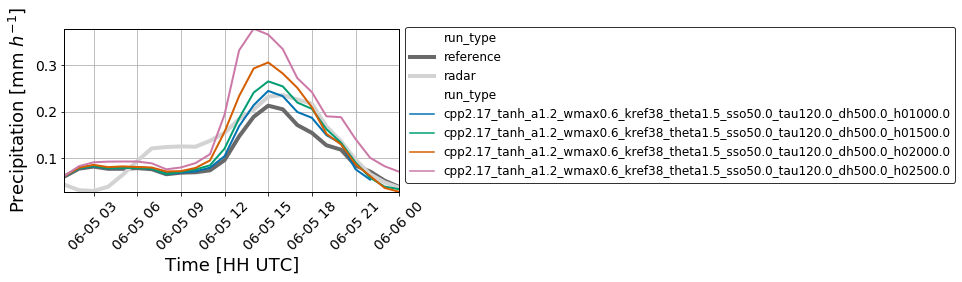

In [5]:
df = prec_arrays.where(radar_mask).mean(['rlon','rlat']).to_dataframe()[run_list]
df = df.stack().reset_index()
df = df.rename(columns={'level_1':'run_type', 0:'precipitation'})

refrad_runs =  ['reference', 'radar']
colors, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
plt.figure(figsize=[6,3])
sns.lineplot(x = 'time', y = 'precipitation', hue='run_type', data = df, hue_order=refrad_runs,#legend=False,
            palette=colors, size='run_type', sizes= linewidths, size_order =refrad_runs)

sns.lineplot(x = 'time', y = 'precipitation',
             hue='run_type',
             data = df[df['run_type'].isin(run_list[1:-1])], 
             #palette=sns.color_palette("colorblind", 12),#[::-1],
            linewidth=2)


leg = plt.legend(loc='lower left' , ncol=1, fontsize=12., bbox_to_anchor=[1.,0.02])
#leg = plt.legend(loc='upper left' , ncol=1, fontsize=11.35)
leg.get_frame().set_alpha(0.8)
plt.xticks(rotation=45)
plt.ylabel(r'Precipitation [mm $h^{-1}$]')
plt.xlabel('Time [HH UTC]')
plt.grid()
#plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)


(array([0, 1, 2, 3, 4, 5]), <a list of 6 Text xticklabel objects>)

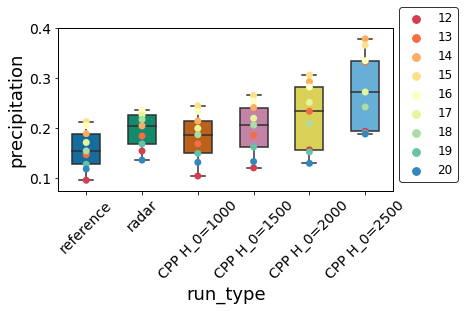

In [113]:
egg = prec_arrays.where(radar_mask).isel(time=slice(11,20)).mean(['rlat', 'rlon']).drop(['height_2m','height_10m', 'wbt_13c', 'height_toa'])
egg = egg.to_array()
egg.name ='precipitation'
df = egg.to_dataframe().stack().reset_index()
df = df.rename(columns={'variable':'run_type', 0:'precipitation'})
df.time = df.time.dt.hour
refrad_runs =  ['reference', 'radar']
colors, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
plt.figure(figsize=[6,3])

sns.boxplot(x = 'run_type', y = 'precipitation', data = df,width=0.5, order=run_list ) #hue_order=refrad_runs,#legend=False,
     #, size='run_type', sizes= linewidths, size_order =refrad_runs)
    

sns.stripplot(x = 'run_type', y = 'precipitation', data = df, hue='time',jitter=False,size=7, #hue_order=refrad_runs,#legend=False,
            palette='Spectral', order=run_list)#, size='run_type', sizes= linewidths, size_order =refrad_runs)
    
leg = plt.legend(loc='lower left' , ncol=1, fontsize=12., bbox_to_anchor=[1.,0.02])
#leg = plt.legend(loc='upper left' , ncol=1, fontsize=11.35)
leg.get_frame().set_alpha(0.8)
    
plt.xticks(rotation=45)

In [97]:
from fss_functions import compute_fss

fss_df = compute_fss(selected_run_list=run_list, prec_arrays=prec_arrays.where(radar_mask))#.isel(ens=1))


INFO: Now computing fss
100%|██████████| 24/24 [00:50<00:00,  2.09s/it]
INFO: Note: NumExpr detected 32 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO: NumExpr defaulting to 8 threads.


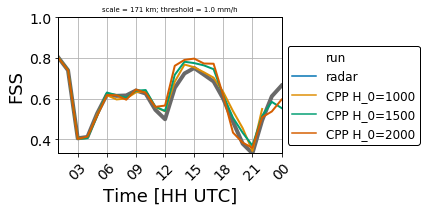

In [98]:
plt.figure(figsize=[4,2.5])
scale = 61
threshold=1
fss_sel = fss_df[(fss_df.scale==scale) & (fss_df.threshold==threshold)]

ref=  ['reference']
colors, linewidths = get_color_and_lw(ref, prec_arrays)
sns.lineplot(data=fss_sel, x = 'time', y = 'FSS', hue = 'run', 
             hue_order=ref, palette=colors,legend=False,
            size='run', size_order=ref, sizes = linewidths)

sns.lineplot(x = 'time', y = 'FSS',hue = 'run', 
             data = fss_sel[fss_sel['run'].isin(run_list[1:-1])],# legend=False,
             palette=sns.color_palette("colorblind", 4),
            linewidth=2)


#leg = plt.legend(loc='upper left' , ncol=1, fontsize=14.)
leg = plt.legend(loc='lower left' , ncol=1, fontsize=12., bbox_to_anchor=[1.,0.02])
#leg.get_frame().set_alpha(0.8)
plt.xticks(rotation=45)
plt.ylabel(r'FSS')
plt.xlabel('Time [HH UTC]')
plt.grid()
plt.title('scale = %.0f km; threshold = %.1f mm/h'%(scale*2.8, threshold), fontsize='x-small')
plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)
#figname = '../../Thesis/Figures/CPPERT/FSS_timeseries_%s_%s.pdf'%(default_tau, sens_param)
#plt.savefig(figname,bbox_inches='tight')

(array([0, 1, 2, 3]), <a list of 4 Text xticklabel objects>)

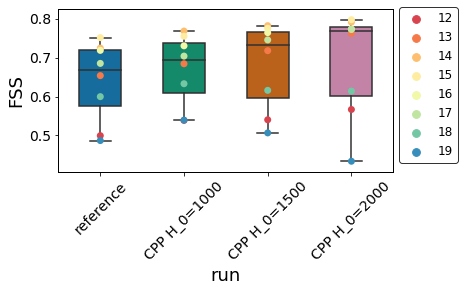

In [116]:
scale = 61
threshold=1
fss_sel = fss_df[(fss_df.scale==scale) & (fss_df.threshold==threshold) ]

fss_sel = fss_sel.rename(columns={'variable':'run_type', 0:'precipitation'})
fss_sel.time = fss_sel.time.dt.hour
fss_sel = fss_sel[(fss_sel.time>11) & (fss_sel.time<20) & (fss_sel.run !='radar')]
refrad_runs =  ['reference']
colors, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
plt.figure(figsize=[6,3])

sns.boxplot(x = 'run', y = 'FSS', data = fss_sel,width=0.5) #hue_order=refrad_runs,#legend=False,
     #, size='run_type', sizes= linewidths, size_order =refrad_runs)
    

sns.stripplot(x = 'run', y = 'FSS', data = fss_sel, hue='time', #hue_order=refrad_runs,#legend=False,
            palette='Spectral',jitter=False,size=7)#, size='run_type', sizes= linewidths, size_order =refrad_runs)
    
leg = plt.legend(loc='lower left' , ncol=1, fontsize=12., bbox_to_anchor=[1.,0.02])
#leg = plt.legend(loc='upper left' , ncol=1, fontsize=11.35)
leg.get_frame().set_alpha(0.8)
    
plt.xticks(rotation=45)

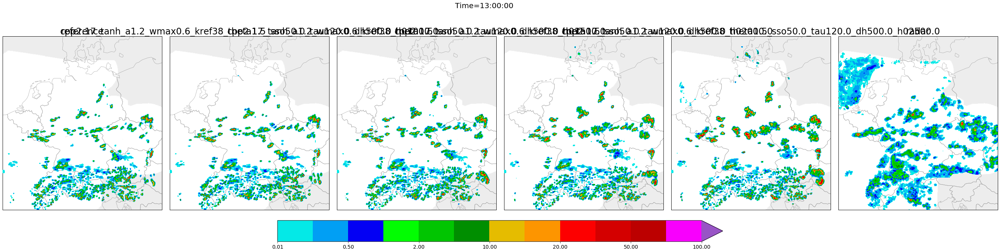

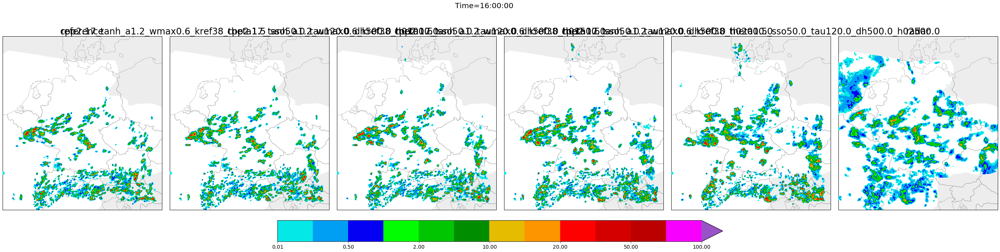

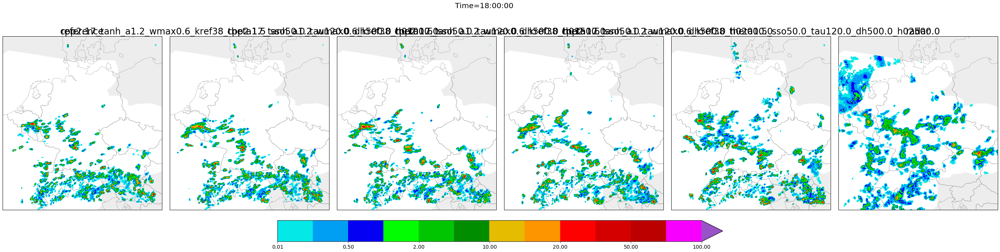

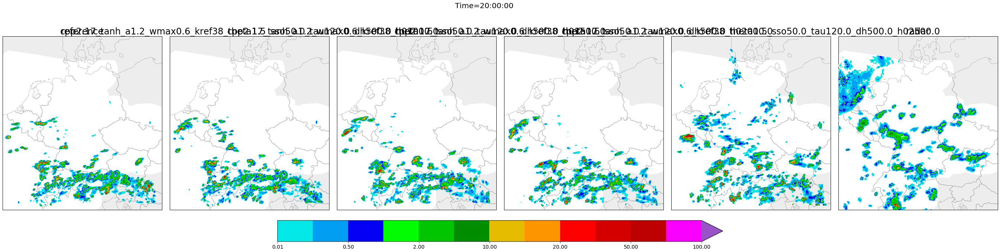

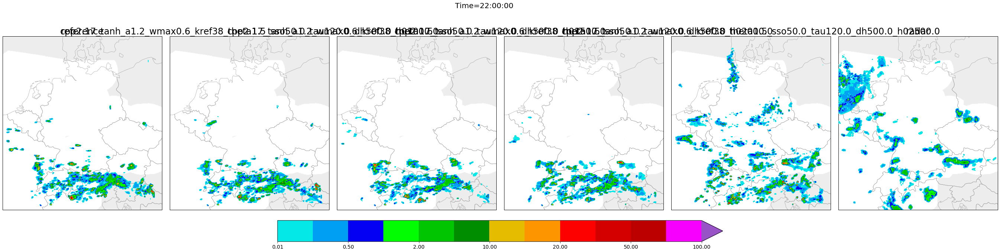

In [147]:
levs = np.array([0.01,0.1, 0.5, 1., 2., 6., 10., 15, 20., 30, 50,
                     70, 100]) 
for ti in [12,15, 17,19,21]:
    fig,axs = plot_prec_fields(prec_arrays, ti =ti, radar_mask=radar_mask, levels = levs,names = run_list)

## Changes in timescale tau

In [5]:
from misc_functions import get_prec_data, plot_prec_fields
date='20160605'

run_list =  ['reference',
                'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau100.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau150.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a0.3_wmax0.6_kref38_theta1.5_sso50.0_tau30.0_dh500.0_h01500.0', 
             'cpp2.17_tanh_a2.0_wmax0.6_kref38_theta1.5_sso50.0_tau200.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a3.0_wmax0.6_kref38_theta1.5_sso50.0_tau300.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a6.0_wmax0.6_kref38_theta1.5_sso50.0_tau600.0_dh500.0_h01500.0',
                
             'radar']


prec_arrays = get_prec_data(run_names = run_list, date = date)
radar_mask = get_radar_mask(date=date, use_time_dependent=False)   

100%|██████████| 9/9 [00:47<00:00,  4.46s/it]


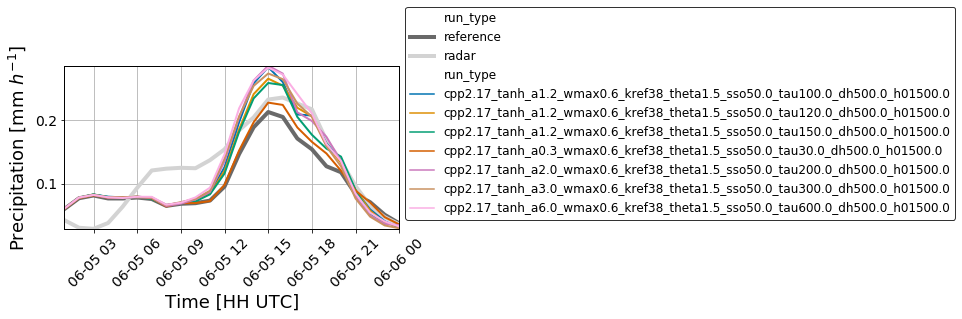

In [6]:
df = prec_arrays.where(radar_mask).mean(['rlon','rlat']).to_dataframe()[run_list]
df = df.stack().reset_index()
df = df.rename(columns={'level_1':'run_type', 0:'precipitation'})

refrad_runs =  ['reference', 'radar']
colors, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
plt.figure(figsize=[6,3])
sns.lineplot(x = 'time', y = 'precipitation', hue='run_type', data = df, hue_order=refrad_runs,#legend=False,
            palette=colors, size='run_type', sizes= linewidths, size_order =refrad_runs)

sns.lineplot(x = 'time', y = 'precipitation',
             hue='run_type',
             data = df[df['run_type'].isin(run_list[1:-1])], 
             palette=sns.color_palette("colorblind", 7),#[::-1],
            linewidth=2)


leg = plt.legend(loc='lower left' , ncol=1, fontsize=12., bbox_to_anchor=[1.,0.02])
#leg = plt.legend(loc='upper left' , ncol=1, fontsize=11.35)
leg.get_frame().set_alpha(0.8)
plt.xticks(rotation=45)
plt.ylabel(r'Precipitation [mm $h^{-1}$]')
plt.xlabel('Time [HH UTC]')
plt.grid()
#plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)


In [7]:
from fss_functions import compute_fss

fss_df = compute_fss(selected_run_list=run_list, prec_arrays=prec_arrays.where(radar_mask))#.isel(ens=1))


INFO: Now computing fss
100%|██████████| 24/24 [01:17<00:00,  3.20s/it]
INFO: Note: NumExpr detected 32 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO: NumExpr defaulting to 8 threads.


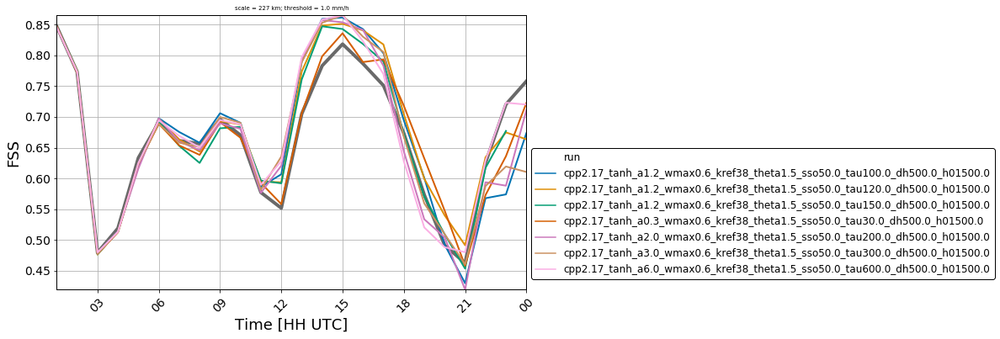

In [10]:
plt.figure(figsize=[10,6])
scale = 81
threshold=1
fss_sel = fss_df[(fss_df.scale==scale) & (fss_df.threshold==threshold)]

ref=  ['reference']
colors, linewidths = get_color_and_lw(ref, prec_arrays)
sns.lineplot(data=fss_sel, x = 'time', y = 'FSS', hue = 'run', 
             hue_order=ref, palette=colors,legend=False,
            size='run', size_order=ref, sizes = linewidths)

sns.lineplot(x = 'time', y = 'FSS',hue = 'run', 
             data = fss_sel[fss_sel['run'].isin(run_list[1:-1])],# legend=False,
             palette=sns.color_palette("colorblind",7),
            linewidth=2)



#leg = plt.legend(loc='upper left' , ncol=1, fontsize=14.)
leg = plt.legend(loc='lower left' , ncol=1, fontsize=12., bbox_to_anchor=[1.,0.02])
#leg.get_frame().set_alpha(0.8)
plt.xticks(rotation=45)
plt.ylabel(r'FSS')
plt.xlabel('Time [HH UTC]')
plt.grid()
plt.title('scale = %.0f km; threshold = %.1f mm/h'%(scale*2.8, threshold), fontsize='x-small')
plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)
#figname = '../../Thesis/Figures/CPPERT/FSS_timeseries_%s_%s.pdf'%(default_tau, sens_param)
#plt.savefig(figname,bbox_inches='tight')

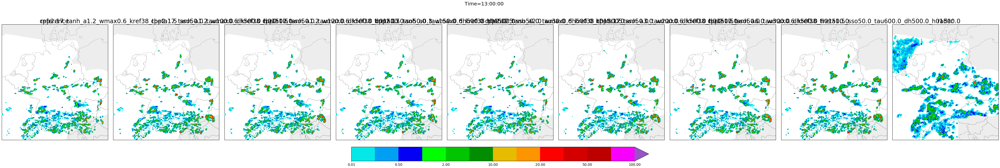

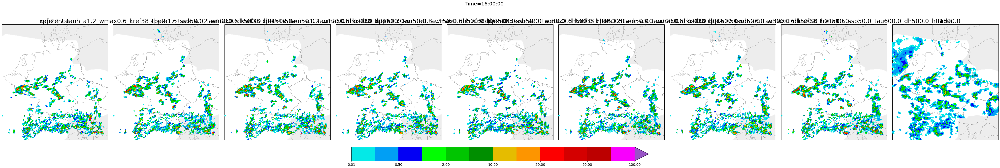

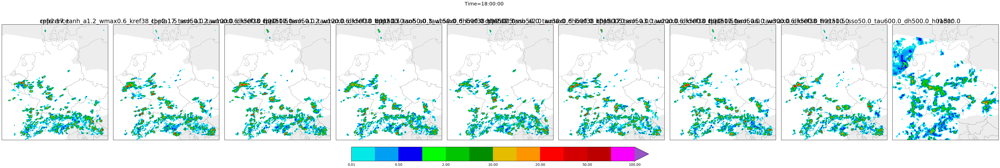

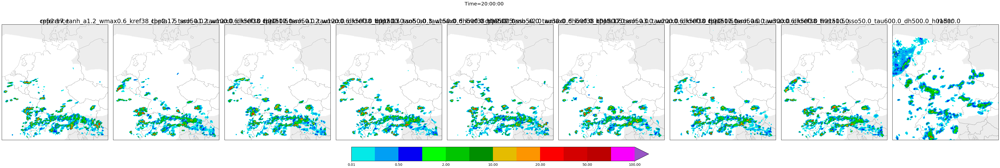

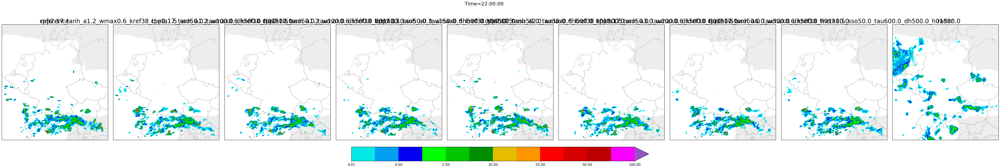

In [63]:
levs = np.array([0.01,0.1, 0.5, 1., 2., 6., 10., 15, 20., 30, 50,
                     70, 100]) 
for ti in [12,15, 17,19,21]:
    fig,axs = plot_prec_fields(prec_arrays, ti =ti, radar_mask=radar_mask, levels = levs,names = run_list)

In [21]:
dsets = dict()
date = 20160605
dsets['ref'] = get_data(run_name = 'reference', load_hourly=True, date=date)
dsets['cpp2.17'] = get_data(run_name = 'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0', load_hourly=True, date = date)
dsets['cpp2.17_tau10'] = get_data(run_name = 'cpp2.17_tanh_a6.0_wmax0.6_kref38_theta1.5_sso50.0_tau600.0_dh500.0_h01500.0', load_hourly=True, date = date)


In [78]:
ds = dsets['cpp2.17']
tv_grad = ds.DUMMY.isel(level=-1)
tv_avg = ds.DUMMY.isel(level=-2)
mul_factor = ds.DUMMY.isel(level=-5)
W0 = ds.DUMMY.isel(level=-4)
B = ds.DUMMY.isel(level=-3)

2016-06-05T16:00:00.000000000


Text(0.5, 1.0, '(a) CPP2.17 tau10min $w$ (level 38)')

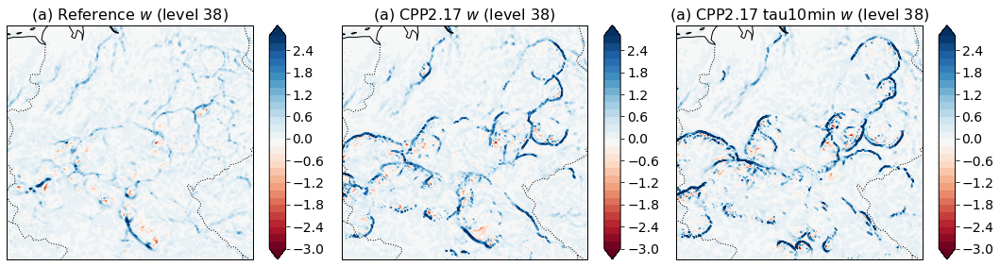

In [30]:
%matplotlib inline
time = dsets['ref'].time.isel(time=16)
print(time.values)
kws = dict(levels = np.arange (-3,3,.2), cmap='RdBu')
projection = ccrs.RotatedPole(
        pole_latitude=dsets['cpp2.17'].rotated_pole.grid_north_pole_latitude,
        pole_longitude=dsets['cpp2.17'].rotated_pole.grid_north_pole_longitude)
fig, axs = plt.subplots(ncols=3, nrows=1, subplot_kw={'projection': projection},
                        sharex=True, sharey=True, figsize=[18,6])

axs=axs.ravel()
my_contour(dsets['ref'].W.sel(time=time, level1=38).isel(rlat=slice(150,350),rlon=slice(100,310)),figure = fig, axes = axs[0], **kws);
axs[0].set_title(r'(a) Reference $w$ (level 38)', fontsize=16)
my_contour(dsets['cpp2.17'].W.sel(time=time, level1=38).isel(rlat=slice(150,350),rlon=slice(100,310)),figure = fig, axes = axs[1], **kws);
axs[1].set_title(r'(a) CPP2.17 $w$ (level 38)', fontsize=16)
my_contour(dsets['cpp2.17_tau10'].W.sel(time=time, level1=38).isel(rlat=slice(150,350),rlon=slice(100,310)),figure = fig, axes = axs[2], **kws);
axs[2].set_title(r'(a) CPP2.17 tau10min $w$ (level 38)', fontsize=16)

#plt.savefig('../Figures/Paper/w_fields_examples_t15.svg')
#plt.savefig('../Figures/Paper/w_fields_examples_t15.pdf')

In [64]:
from SAL_cosmo_utils import compute_SAL
def compute_SAL2(*args, **kwargs):
    S,_,_,_,_,_,_,_,_,_ = compute_SAL(*args,**kwargs)
    return(S)

kws = dict(user_threshold=None)

fcst = prec_arrays.to_array('run').where(radar_mask)
fcst = xr.where(fcst<0,0,fcst)# negative values are not possible
fcst = fcst.chunk({'time':1, 'run':1})

S_SAL = xr.apply_ufunc(compute_SAL2, prec_arrays['radar'].compute().chunk({'time':1}), fcst,
                     input_core_dims= [['rlat', 'rlon',], ['rlat', 'rlon']],
                     #output_core_dims=[['thresholds','scales']],
                     vectorize=True, 
                     dask = 'parallelized', output_dtypes=[float],# output_sizes = {'thresholds':3,'scales':4}, 
                      kwargs = kws).compute()
S_SAL.name='S-SAL'

In [65]:
S_df = S_SAL.to_dataframe().reset_index().rename(columns={'run':'run_type'})#.fillna(0)
print(S_df.columns)
#S_df = format_parameters(S_df)
S_df.describe()

Index(['time', 'run_type', 'rotated_pole', 'height_2m', 'height_10m',
       'height_toa', 'wbt_13c', 'S-SAL'],
      dtype='object')


,height_2m,height_10m,height_toa,wbt_13c,S-SAL
count,216.0,216.0,216.0,2.160000e+02,215.000000
mean,2.0,10.0,22000.0,1.300001e+00,-1.085361
std,0.0,0.0,0.0,8.364034e-07,0.477584
min,2.0,10.0,22000.0,1.300000e+00,-1.709209
25%,2.0,10.0,22000.0,1.300000e+00,-1.434187
50%,2.0,10.0,22000.0,1.300000e+00,-1.212466
75%,2.0,10.0,22000.0,1.300000e+00,-0.962666
max,2.0,10.0,22000.0,1.300000e+00,0.000000


In [131]:
S_df['run_type'].unique()

array(['reference',
       'cpp2.17_tanh_a1.0_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
       'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
       'cpp2.17_tanh_a1.5_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
       'radar'], dtype=object)

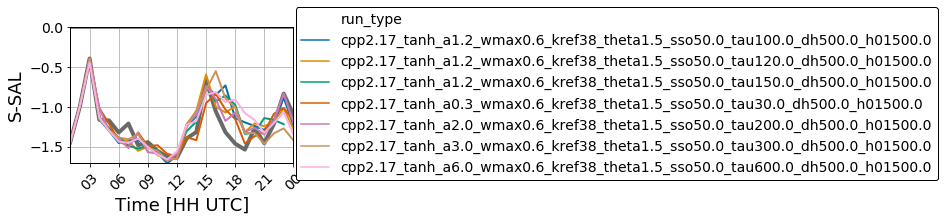

In [66]:
from matplotlib.dates import DateFormatter
#default_tau='deftau10min'
#sens_param='senstau'
#selected_run_list,line_kws, n_hues= get_run_selection(default_tau, sens_param, return_line_kws=True)

plt.figure(figsize=[4,2.5])
ref=  ['reference']
colors, linewidths = get_color_and_lw(ref, prec_arrays)
sns.lineplot(data=S_df, x = 'time', y = 'S-SAL', hue = 'run_type', 
             hue_order=ref, palette=colors, legend=False,
            size='run_type', size_order=ref, sizes = linewidths)

sns.lineplot(x = 'time', y = 'S-SAL',
             #style='kref',hue='$\\alpha_{cp}$',
             hue='run_type', 
             #hue ='$\\tau \\,[min]$',
             data = S_df[S_df['run_type'].isin(run_list[1:-1])], 
             palette=sns.color_palette("colorblind",7), #legend=False,
            linewidth=2)


#leg = plt.legend(loc='upper left' , ncol=1, fontsize=12)
#leg.get_frame().set_alpha(0.8)
leg = plt.legend(bbox_to_anchor=(1.01, 1.15), loc=2, borderaxespad=0.,)
plt.xticks(rotation=45)
plt.ylabel(r'S-SAL')
plt.xlabel('Time [HH UTC]')
plt.grid()
plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.hlines(0,min(S_df.time),max(S_df.time),colors='grey',linewidth=3)
#plt.title('threshold = %.1f mm/h'%(S_df.threshold_fcst[0]), fontsize='x-large')
plt.gca().autoscale(tight=True)
#lt.savefig('../Figures/Paper/SSAL_ts_alpha.pdf')

## Changes in wmax

In [172]:
from misc_functions import get_prec_data, plot_prec_fields
date='20160605'

run_list =  ['reference',
                #'cpp2.17_tanh_a0.9_wmax0.7_kref38_theta1.5_sso50.0_tau100.0_dh500.0_h01500.0',
                #'cpp2.17_tanh_a0.9_wmax0.6_kref38_theta1.5_sso50.0_tau100.0_dh500.0_h01500.0',
                #'cpp2.17_tanh_a1.0_wmax0.5_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a1.2_wmax0.3_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a1.2_wmax0.5_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a1.2_wmax0.7_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             'radar']


prec_arrays = get_prec_data(run_names = run_list, date = date)
radar_mask = get_radar_mask(date=date, use_time_dependent=False)   

100%|██████████| 6/6 [00:29<00:00,  4.29s/it]


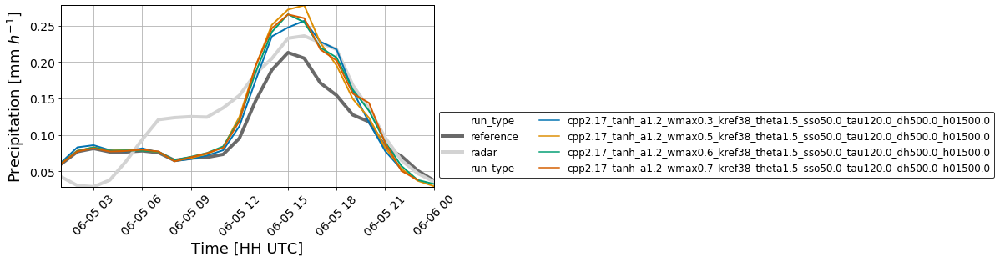

In [182]:
df = prec_arrays.where(radar_mask).mean(['rlon','rlat']).to_dataframe()[run_list]
df = df.stack().reset_index()
df = df.rename(columns={'level_1':'run_type', 0:'precipitation'})

refrad_runs =  ['reference', 'radar']
colors, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
plt.figure(figsize=[8,4])
sns.lineplot(x = 'time', y = 'precipitation', hue='run_type', data = df, hue_order=refrad_runs,#legend=False,
            palette=colors, size='run_type', sizes= linewidths, size_order =refrad_runs)

sns.lineplot(x = 'time', y = 'precipitation',
             hue='run_type',
             data = df[df['run_type'].isin(run_list[1:5])], 
             palette=sns.color_palette("colorblind", 4),#::-1],
            linewidth=2)


leg = plt.legend(loc='lower left' , ncol=2, fontsize=12., bbox_to_anchor=[1.,0.02])
#leg = plt.legend(loc='upper left' , ncol=1, fontsize=11.35)
leg.get_frame().set_alpha(0.8)
plt.xticks(rotation=45)
plt.ylabel(r'Precipitation [mm $h^{-1}$]')
plt.xlabel('Time [HH UTC]')
plt.grid()
#plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)


In [174]:
from fss_functions import compute_fss

fss_df = compute_fss(selected_run_list=run_list, prec_arrays=prec_arrays.where(radar_mask))#.isel(ens=1))


INFO: Now computing fss
100%|██████████| 24/24 [00:49<00:00,  2.03s/it]


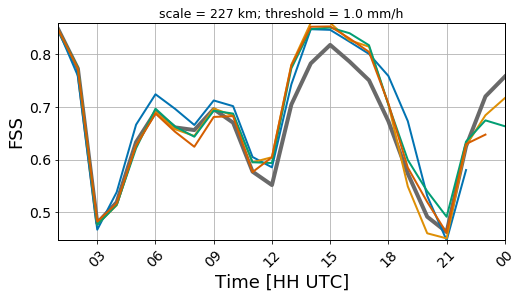

In [183]:
plt.figure(figsize=[8,4])
scale = 81
threshold=1
fss_sel = fss_df[(fss_df.scale==scale) & (fss_df.threshold==threshold)]

ref=  ['reference']
colors, linewidths = get_color_and_lw(ref, prec_arrays)
sns.lineplot(data=fss_sel, x = 'time', y = 'FSS', hue = 'run', 
             hue_order=ref, palette=colors,legend=False,
            size='run', size_order=ref, sizes = linewidths)

sns.lineplot(x = 'time', y = 'FSS',hue = 'run', 
             data = fss_sel[fss_sel['run'].isin(run_list[1:-1])], legend=False,
             palette=sns.color_palette("colorblind", 4),
            linewidth=2)


#leg = plt.legend(loc='upper left' , ncol=1, fontsize=14.)
#leg.get_frame().set_alpha(0.8)
plt.xticks(rotation=45)
plt.ylabel(r'FSS')
plt.xlabel('Time [HH UTC]')
plt.grid()
plt.title('scale = %.0f km; threshold = %.1f mm/h'%(scale*2.8, threshold), fontsize='x-small')
plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)
#figname = '../../Thesis/Figures/CPPERT/FSS_timeseries_%s_%s.pdf'%(default_tau, sens_param)
#plt.savefig(figname,bbox_inches='tight')

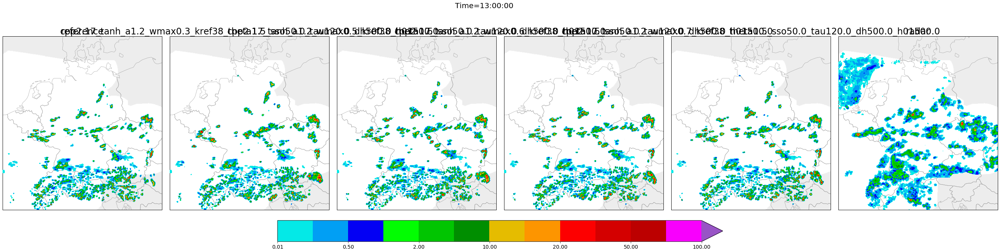

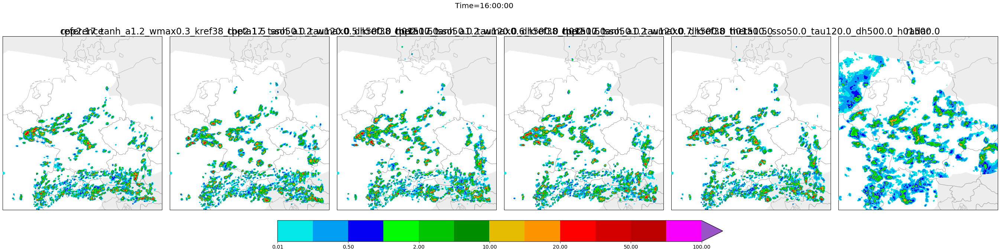

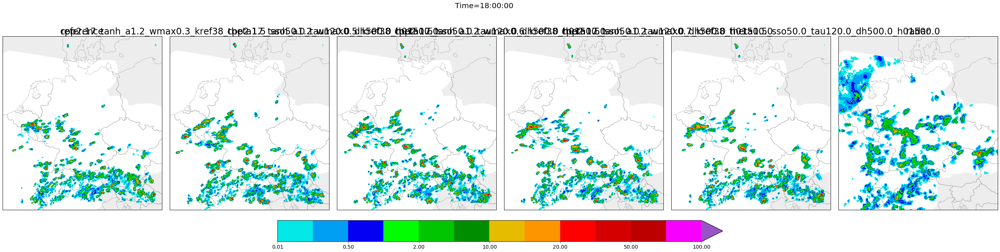

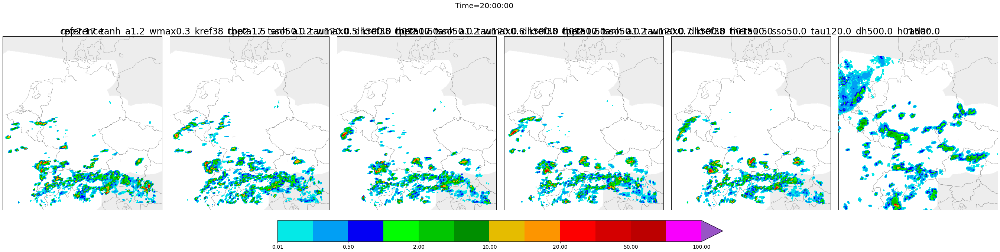

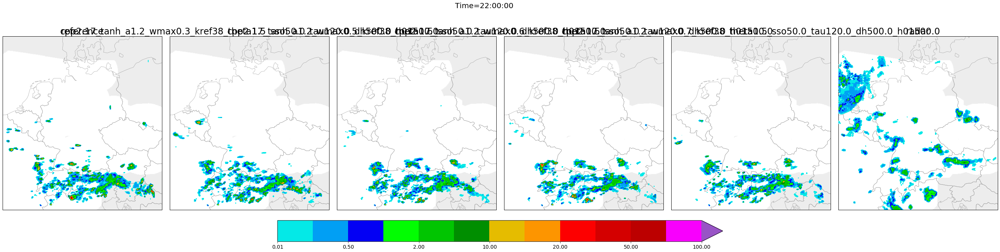

In [177]:
levs = np.array([0.01,0.1, 0.5, 1., 2., 6., 10., 15, 20., 30, 50,
                     70, 100]) 
for ti in [12,15, 17,19,21]:
    fig,axs = plot_prec_fields(prec_arrays, ti =ti, radar_mask=radar_mask, levels = levs,names = run_list)

### Histogram

In [46]:
time = prec_arrays['reference'].isel(time=slice(12,22)).time
print(time)
#selected_run_list = run_selection_test.copy()
#selected_run_list.extend(['reference','radar','2moment_reference',])
df_hist =prec_arrays[run_list].sel(time=time).stack(x = ['time', 'rlon', 'rlat']).to_dataframe()[run_list]
bins = [0.1, 0.2, 0.5, 1.0, 2.0, 5.0, 10, 500]
labels =[str(b) + '-' for b in bins[:-1]]
egg=[]
for run in run_list:
    egg.append( pd.cut(df_hist[df_hist>0.1][run], bins=bins, labels  = labels, include_lowest=True).value_counts(sort=False)/df_hist[df_hist>0.1]['radar'].count())


<xarray.DataArray 'time' (time: 10)>
array(['2016-06-05T13:00:00.000000000', '2016-06-05T14:00:00.000000000',
       '2016-06-05T15:00:00.000000000', '2016-06-05T16:00:00.000000000',
       '2016-06-05T17:00:00.000000000', '2016-06-05T18:00:00.000000000',
       '2016-06-05T19:00:00.000000000', '2016-06-05T20:00:00.000000000',
       '2016-06-05T21:00:00.000000000', '2016-06-05T22:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time          (time) datetime64[ns] 2016-06-05T13:00:00 ... 2016-06-05T22:00:00
    rotated_pole  |S1 b''
    height_2m     float32 2.0
    height_10m    float32 10.0
    height_toa    float32 22000.0
    wbt_13c       float32 1.3
Attributes:
    standard_name:  time
    long_name:      time
    bounds:         time_bnds


Text(0.5, 1.0, '13-22 UTC')

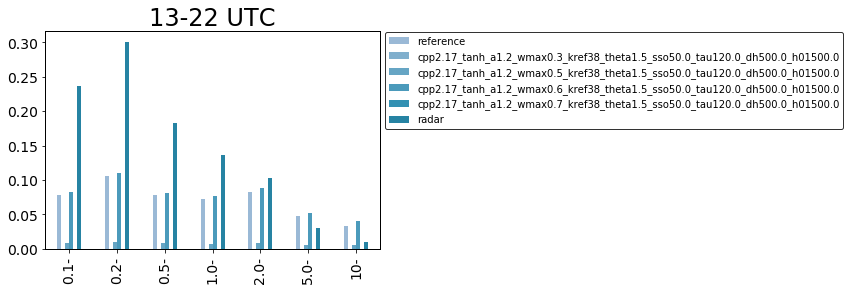

In [47]:

    
colors, linewidths = get_color_and_lw(run_list, prec_arrays)

colors = sns.color_palette("PuBuGn_d", 10)[::-1]
colors.extend(['dimgrey', 'lightgrey'])

pd.concat(egg, axis=1).plot.bar(colors=colors)

leg = plt.legend(bbox_to_anchor=[1.,1.02], ncol=1, fontsize='medium')
leg.get_frame().set_alpha(0.8)
plt.title(str(time.dt.hour[0].values)+ '-' + str(time.dt.hour[-1].values)+' UTC')

## Changes in alpha

In [4]:
from misc_functions import get_prec_data, plot_prec_fields
date='20160605'

run_list =  ['reference',
             #'cpp2.17_tanh_a1.5_wmax0.6_kref38_theta1.5_sso50.0_tau100.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a2.0_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a1.7_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             'cpp2.17_tanh_a1.5_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
                'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
             
                 #'cpp2.17_tanh_a1.1_wmax0.6_kref38_theta1.5_sso50.0_tau100.0_dh500.0_h01500.0',
                 #'cpp2.17_tanh_a1.0_wmax0.6_kref38_theta1.5_sso50.0_tau100.0_dh500.0_h01500.0',
                 # 'cpp2.17_tanh_a0.9_wmax0.6_kref38_theta1.5_sso50.0_tau100.0_dh500.0_h01500.0',
                 #'cpp2.17_tanh_a0.8_wmax0.6_kref38_theta1.5_sso50.0_tau100.0_dh500.0_h01500.0',
             'radar']


prec_arrays = get_prec_data(run_names = run_list, date = date)
radar_mask = get_radar_mask(date=date, use_time_dependent=False)   

100%|██████████| 6/6 [00:27<00:00,  3.90s/it]


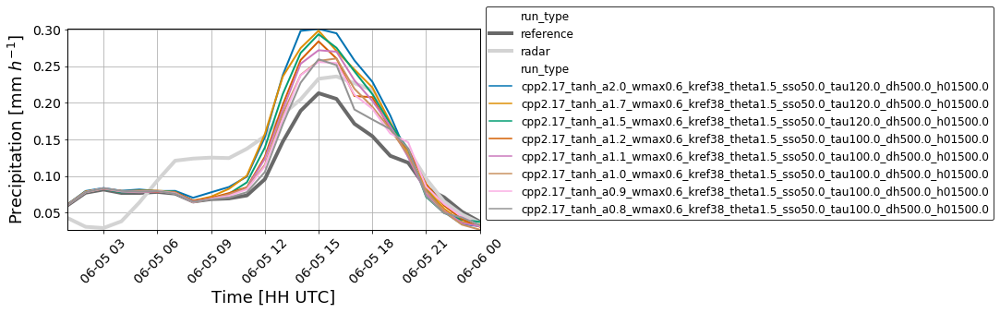

In [185]:
df = prec_arrays.where(radar_mask).mean(['rlon','rlat']).to_dataframe()[run_list]
df = df.stack().reset_index()
df = df.rename(columns={'level_1':'run_type', 0:'precipitation'})

refrad_runs =  ['reference', 'radar']
colors, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
plt.figure(figsize=[8,4])
sns.lineplot(x = 'time', y = 'precipitation', hue='run_type', data = df, hue_order=refrad_runs,#legend=False,
            palette=colors, size='run_type', sizes= linewidths, size_order =refrad_runs)

sns.lineplot(x = 'time', y = 'precipitation',
             hue='run_type',
             data = df[df['run_type'].isin(run_list[1:-1])], 
             palette=sns.color_palette("colorblind", 8),#[::-1],
            linewidth=2)


leg = plt.legend(loc='lower left' , ncol=1, fontsize=12., bbox_to_anchor=[1.,0.02])
#leg = plt.legend(loc='upper left' , ncol=1, fontsize=11.35)
leg.get_frame().set_alpha(0.8)
plt.xticks(rotation=45)
plt.ylabel(r'Precipitation [mm $h^{-1}$]')
plt.xlabel('Time [HH UTC]')
plt.grid()
#plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)


In [186]:
from fss_functions import compute_fss

fss_df = compute_fss(selected_run_list=run_list, prec_arrays=prec_arrays.where(radar_mask))#.isel(ens=1))


INFO: Now computing fss
100%|██████████| 24/24 [01:28<00:00,  3.69s/it]


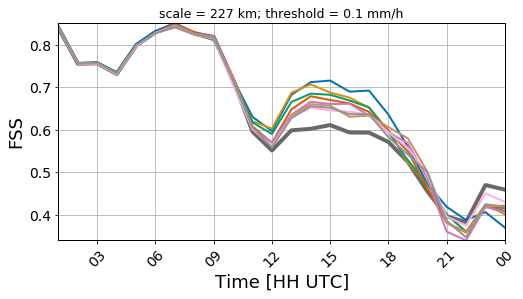

In [192]:
plt.figure(figsize=[8,4])
scale = 81
threshold=.1
fss_sel = fss_df[(fss_df.scale==scale) & (fss_df.threshold==threshold)]

ref=  ['reference']
colors, linewidths = get_color_and_lw(ref, prec_arrays)
sns.lineplot(data=fss_sel, x = 'time', y = 'FSS', hue = 'run', 
             hue_order=ref, palette=colors,legend=False,
            size='run', size_order=ref, sizes = linewidths)

sns.lineplot(x = 'time', y = 'FSS',hue = 'run', 
             data = fss_sel[fss_sel['run'].isin(run_list[1:-1])], legend=False,
             palette=sns.color_palette("colorblind", 8),
            linewidth=2)


#leg = plt.legend(loc='upper left' , ncol=1, fontsize=14.)
#leg.get_frame().set_alpha(0.8)
plt.xticks(rotation=45)
plt.ylabel(r'FSS')
plt.xlabel('Time [HH UTC]')
plt.grid()
plt.title('scale = %.0f km; threshold = %.1f mm/h'%(scale*2.8, threshold), fontsize='x-small')
plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)
#figname = '../../Thesis/Figures/CPPERT/FSS_timeseries_%s_%s.pdf'%(default_tau, sens_param)
#plt.savefig(figname,bbox_inches='tight')

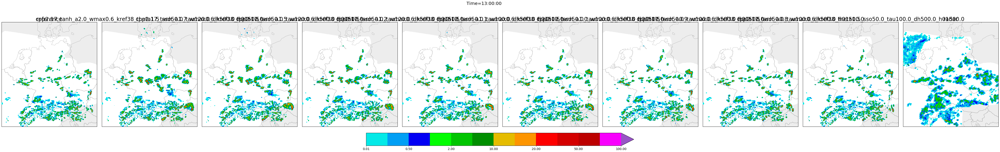

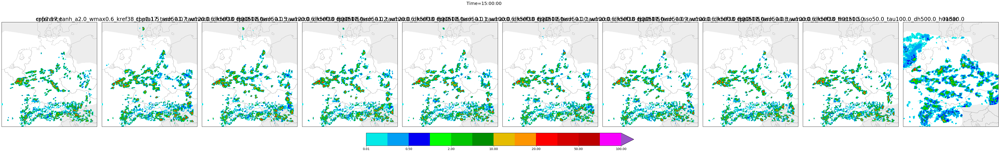

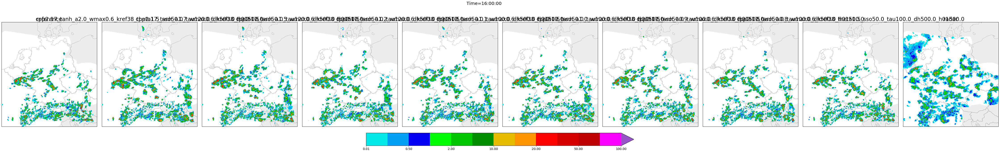

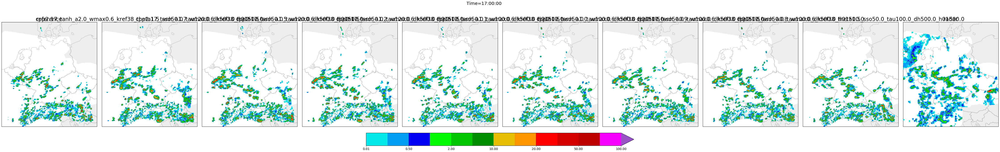

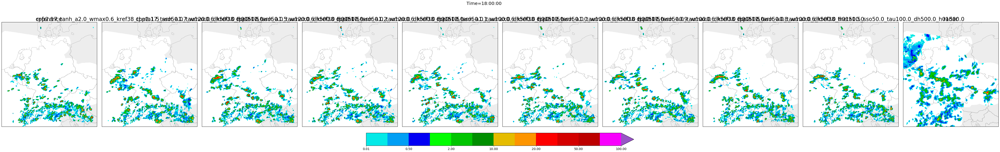

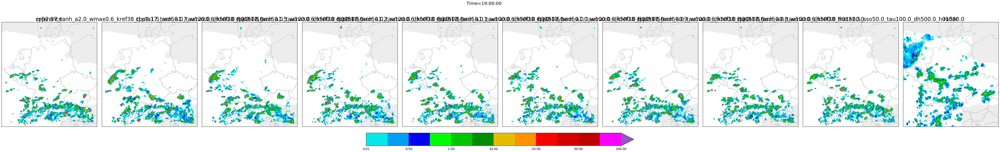

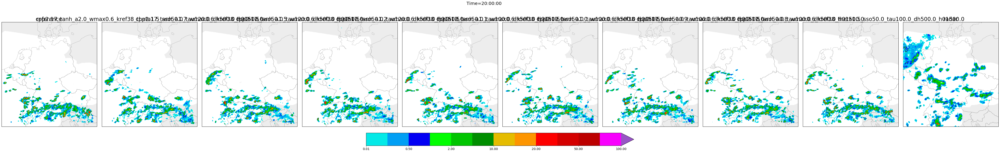

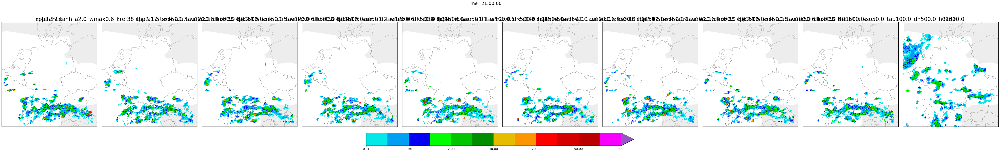

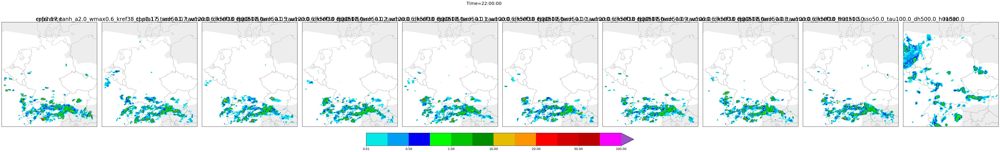

In [43]:
levs = np.array([0.01,0.1, 0.5, 1., 2., 6., 10., 15, 20., 30, 50,
                     70, 100]) 
for ti in [12,14,15,16, 17,18,19,20,21]:
    fig,axs = plot_prec_fields(prec_arrays, ti =ti, radar_mask=radar_mask, levels = levs,names = run_list)

#### Cloud sizes...

In [5]:
from rdf_functions import identify_clouds, identify_clouds_2   
def make_cloud_ds(prec_arrays, radar_mask, water_kws=dict(water=False), prec_thres=(1.0,)):
    egg = prec_arrays.where(radar_mask).compute().to_array(dim='run',name='precipitation').stack(time_run=['time', 'run'])
    labels = egg.groupby('time_run').apply(identify_clouds_2, args =prec_thres, return_var = 'labels', **water_kws)
    cld_size = egg.groupby('time_run').apply(identify_clouds_2, args =prec_thres,return_var='cld_size',**water_kws)
    cld_sum = egg.groupby('time_run').apply(identify_clouds_2, args =prec_thres,return_var='cld_sum', **water_kws)

    cloud_ds=xr.Dataset()
    cloud_ds['labels']= labels
    cloud_ds['cloud_size']= cld_size
    cloud_ds['cloud_sum']= cld_sum
    #cloud_ds = cloud_ds.unstack('time_run')
    cloud_ds = cloud_ds.unstack().rename_dims({'time_run_level_0':'time', 'time_run_level_1':'run'})
    cloud_ds = cloud_ds.rename_vars({'time_run_level_0':'time', 'time_run_level_1':'run'})
    cloud_ds['#_of_clouds'] = (cloud_ds.cloud_size>0).sum('cloud_number')
    cloud_ds['cloud_radius'] = np.sqrt(cloud_ds.cloud_size / np.pi) / 1000  # in km
    cloud_ds.attrs=water_kws
    cloud_ds.attrs['prec_thres'] = 1.0
    return cloud_ds

water_kws= dict(water=True, neighborhood = 3)
prec_thres=(1.0,)
cloud_ds_sep = make_cloud_ds(prec_arrays, radar_mask, water_kws=water_kws, prec_thres=prec_thres)

In [6]:
egg = cloud_ds_sep[['#_of_clouds']]
egg['median_cloud_radii'] = cloud_ds_sep.cloud_radius.median('cloud_number')
egg['mean_cloud_radii'] = cloud_ds_sep.cloud_radius.mean('cloud_number')

cloud_df = egg.to_dataframe().reset_index()
cloud_df = cloud_df.rename(columns={'run':'run_type'})
#cloud_df = format_parameters(cloud_df)
cloud_df.describe()

,#_of_clouds,wbt_13c,height_10m,height_2m,height_toa,median_cloud_radii,mean_cloud_radii
count,144.000000,144.000000,144.0,144.0,144.0,144.000000,144.000000
mean,260.576389,1.300002,10.0,2.0,22000.0,3.839547,4.241837
std,123.934766,0.000002,0.0,0.0,0.0,0.873970,0.817269
min,44.000000,1.300000,10.0,2.0,22000.0,2.234077,3.090623
25%,200.000000,1.300000,10.0,2.0,22000.0,3.159462,3.578826
50%,241.000000,1.300000,10.0,2.0,22000.0,3.869534,4.058372
75%,319.250000,1.300000,10.0,2.0,22000.0,4.179575,4.603903
max,580.000000,1.300000,10.0,2.0,22000.0,6.607814,6.585970


In [7]:
water_kws= dict(water=False, neighborhood = 3)
prec_thres=(1.0,)
cloud_ds_nonsep = make_cloud_ds(prec_arrays, radar_mask, water_kws=water_kws, prec_thres=prec_thres)

In [8]:
egg = cloud_ds_nonsep[['#_of_clouds']]
egg['median_cloud_radii'] = cloud_ds_nonsep.cloud_radius.median('cloud_number')
egg['mean_cloud_radii'] = cloud_ds_nonsep.cloud_radius.mean('cloud_number')

cloud_df_nonsep = egg.to_dataframe().reset_index()
cloud_df_nonsep = cloud_df_nonsep.rename(columns={'run':'run_type'})
#cloud_df_nonsep = format_parameters(cloud_df_nonsep)
cloud_df_nonsep.describe()

,#_of_clouds,wbt_13c,height_10m,height_2m,height_toa,median_cloud_radii,mean_cloud_radii
count,144.000000,144.000000,144.0,144.0,144.0,144.000000,144.000000
mean,168.402778,1.300002,10.0,2.0,22000.0,3.719082,5.332461
std,85.612995,0.000002,0.0,0.0,0.0,0.922636,1.452351
min,23.000000,1.300000,10.0,2.0,22000.0,2.234077,3.605053
25%,113.250000,1.300000,10.0,2.0,22000.0,3.159462,4.205909
50%,162.500000,1.300000,10.0,2.0,22000.0,3.532386,4.900002
75%,199.000000,1.300000,10.0,2.0,22000.0,4.179575,5.824105
max,354.000000,1.300000,10.0,2.0,22000.0,6.885887,10.189733


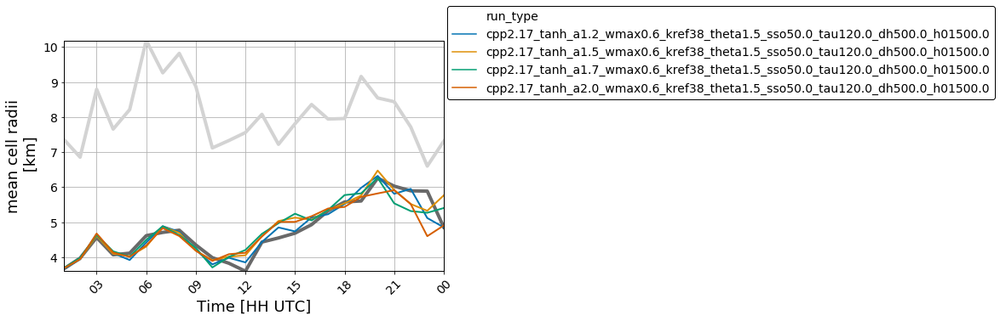

In [14]:
refrad_runs =  ['reference', 'radar']
colors, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
plt.figure(figsize=[8,5])
sns.lineplot(x = 'time', y = 'mean_cloud_radii', hue='run_type', data = cloud_df_nonsep, 
             hue_order=refrad_runs, legend=False,
            palette=colors, size='run_type', sizes= linewidths, size_order =refrad_runs)

sns.lineplot(x = 'time', y = 'mean_cloud_radii',
             #hue='$\\alpha_{cp}$',style='$w_{max} [m s^{-1}]$',
             hue='run_type',
             #style='$w_{max} [m s^{-1}]$',
            #hue='$\\alpha_{cp}$', size ='fixedH',
             data = cloud_df_nonsep[cloud_df_nonsep['run_type'].isin(run_list[1:-1])], 
             palette=sns.color_palette("colorblind",4),
            linewidth=2,)


#leg = plt.legend(loc='lower left' , ncol=1, fontsize='11.5')
#leg.get_frame().set_alpha(0.8)
leg = plt.legend(bbox_to_anchor=(1.01, 1.15), loc=2, borderaxespad=0.,)
plt.xticks(rotation=45)
#lt.ylabel(r'mediancloud size')
plt.xlabel('Time [HH UTC]')
plt.ylabel('mean cell radii\n [km]')
plt.grid()
plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)


In [ ]:
selected_run_list

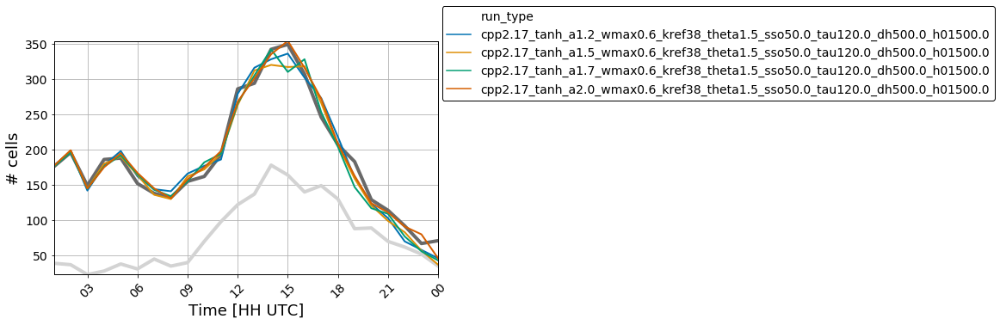

In [15]:

refrad_runs =  ['reference', 'radar']
colors, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
plt.figure(figsize=[8,5])
sns.lineplot(x = 'time', y = '#_of_clouds', hue='run_type', data = cloud_df_nonsep,
             hue_order=refrad_runs, legend=False,
            palette=colors, size='run_type', sizes= linewidths, size_order =refrad_runs)

sns.lineplot(x = 'time', y = '#_of_clouds',
             #hue='$\\alpha_{cp}$',style='$w_{max} [m s^{-1}]$',
             hue='run_type',
             #style='$w_{max} [m s^{-1}]$',
            #hue='$\\alpha_{cp}$', size ='fixedH',
             data = cloud_df_nonsep[cloud_df_nonsep['run_type'].isin(run_list[1:-1])], 
             palette=sns.color_palette("colorblind",4), 
             #legend=False,
            linewidth=2,)


#leg = plt.legend(loc='lower left' , ncol=1, fontsize='small')
#leg.get_frame().set_alpha(0.8)
leg = plt.legend(bbox_to_anchor=(1.01, 1.15), loc=2, borderaxespad=0.,)
plt.xticks(rotation=45)
plt.ylabel(r'# cells')
plt.xlabel('Time [HH UTC]')
plt.grid()
plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)


 now separated cells

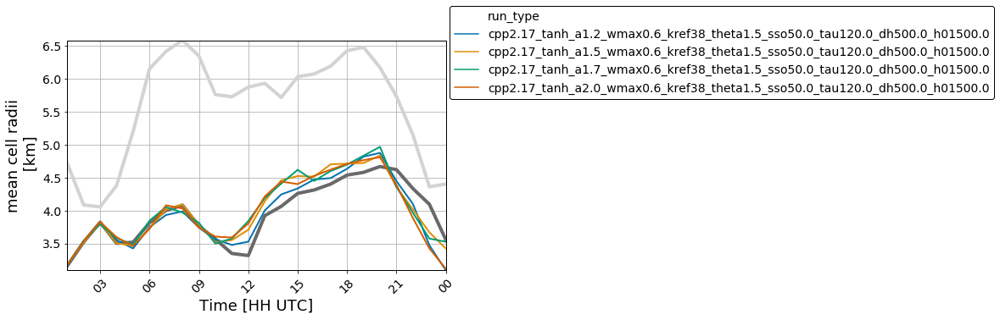

In [16]:
refrad_runs =  ['reference', 'radar']
colors, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
plt.figure(figsize=[8,5])
sns.lineplot(x = 'time', y = 'mean_cloud_radii', hue='run_type', data = cloud_df, 
             hue_order=refrad_runs, legend=False,
            palette=colors, size='run_type', sizes= linewidths, size_order =refrad_runs)

sns.lineplot(x = 'time', y = 'mean_cloud_radii',
             #hue='$\\alpha_{cp}$',style='$w_{max} [m s^{-1}]$',
             hue='run_type',
             #style='$w_{max} [m s^{-1}]$',
            #hue='$\\alpha_{cp}$', size ='fixedH',
             data = cloud_df[cloud_df['run_type'].isin(run_list[1:-1])], 
             palette=sns.color_palette("colorblind",4),
            linewidth=2,)


#leg = plt.legend(loc='lower left' , ncol=1, fontsize='11.5')
#leg.get_frame().set_alpha(0.8)
leg = plt.legend(bbox_to_anchor=(1.01, 1.15), loc=2, borderaxespad=0.,)
plt.xticks(rotation=45)
#lt.ylabel(r'mediancloud size')
plt.xlabel('Time [HH UTC]')
plt.ylabel('mean cell radii\n [km]')
plt.grid()
plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)


In [ ]:
selected_run_list

In [ ]:

refrad_runs =  ['reference', 'radar']
colors, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
plt.figure(figsize=[8,5])
sns.lineplot(x = 'time', y = '#_of_clouds', hue='run_type', data = cloud_df,
             hue_order=refrad_runs, legend=False,
            palette=colors, size='run_type', sizes= linewidths, size_order =refrad_runs)

sns.lineplot(x = 'time', y = '#_of_clouds',
             #hue='$\\alpha_{cp}$',style='$w_{max} [m s^{-1}]$',
             hue='run_type',
             #style='$w_{max} [m s^{-1}]$',
            #hue='$\\alpha_{cp}$', size ='fixedH',
             data = cloud_df[cloud_df['run_type'].isin(run_list[1:-1])], 
             palette=sns.color_palette("colorblind",7), 
             #legend=False,
            linewidth=2,)


#leg = plt.legend(loc='lower left' , ncol=1, fontsize='small')
#leg.get_frame().set_alpha(0.8)
leg = plt.legend(bbox_to_anchor=(1.01, 1.15), loc=2, borderaxespad=0.,)
plt.xticks(rotation=45)
plt.ylabel(r'# cells')
plt.xlabel('Time [HH UTC]')
plt.grid()
plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)


#### Histogram

In [50]:
time = prec_arrays['reference'].isel(time=slice(12,22)).time
print(time)
#selected_run_list = run_selection_test.copy()
#selected_run_list.extend(['reference','radar','2moment_reference',])
df_hist =prec_arrays[run_list].sel(time=time).stack(x = ['time', 'rlon', 'rlat']).to_dataframe()[run_list]
bins = [0.1, 0.2, 0.5, 1.0, 2.0, 5.0, 10, 500]
labels =[str(b) + '-' for b in bins[:-1]]
egg=[]
for run in run_list:
    egg.append( pd.cut(df_hist[df_hist>0.1][run], bins=bins, labels  = labels, include_lowest=True).value_counts(sort=False)/df_hist[df_hist>0.1]['radar'].count())


<xarray.DataArray 'time' (time: 10)>
array(['2016-06-05T13:00:00.000000000', '2016-06-05T14:00:00.000000000',
       '2016-06-05T15:00:00.000000000', '2016-06-05T16:00:00.000000000',
       '2016-06-05T17:00:00.000000000', '2016-06-05T18:00:00.000000000',
       '2016-06-05T19:00:00.000000000', '2016-06-05T20:00:00.000000000',
       '2016-06-05T21:00:00.000000000', '2016-06-05T22:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
    rotated_pole  |S1 b''
    height_2m     float32 2.0
    height_10m    float32 10.0
    height_toa    float32 22000.0
    wbt_13c       float32 1.3
  * time          (time) datetime64[ns] 2016-06-05T13:00:00 ... 2016-06-05T22:00:00
Attributes:
    standard_name:  time
    long_name:      time
    bounds:         time_bnds


Text(0.5, 1.0, '13-22 UTC')

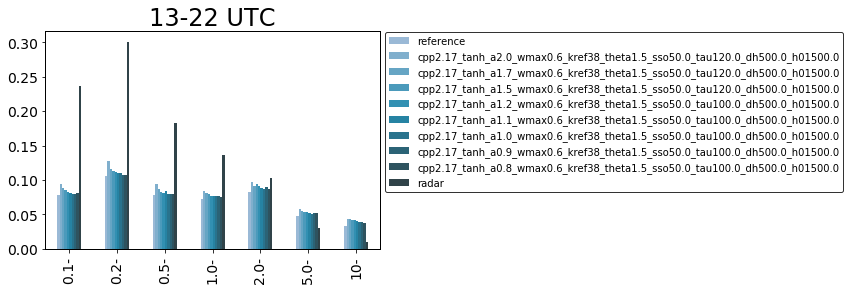

In [51]:

    
colors, linewidths = get_color_and_lw(run_list, prec_arrays)

colors = sns.color_palette("PuBuGn_d", 10)[::-1]
colors.extend(['dimgrey', 'lightgrey'])

pd.concat(egg, axis=1).plot.bar(colors=colors)

leg = plt.legend(bbox_to_anchor=[1.,1.02], ncol=1, fontsize='medium')
leg.get_frame().set_alpha(0.8)
plt.title(str(time.dt.hour[0].values)+ '-' + str(time.dt.hour[-1].values)+' UTC')

#### S-SAL

In [193]:
from SAL_cosmo_utils import compute_SAL
def compute_SAL2(*args, **kwargs):
    S,_,_,_,_,_,_,_,_,_ = compute_SAL(*args,**kwargs)
    return(S)

kws = dict(user_threshold=None)

fcst = prec_arrays.to_array('run').where(radar_mask)
fcst = xr.where(fcst<0,0,fcst)# negative values are not possible
fcst = fcst.chunk({'time':1, 'run':1})

S_SAL = xr.apply_ufunc(compute_SAL2, prec_arrays['radar'].compute().chunk({'time':1}), fcst,
                     input_core_dims= [['rlat', 'rlon',], ['rlat', 'rlon']],
                     #output_core_dims=[['thresholds','scales']],
                     vectorize=True, 
                     dask = 'parallelized', output_dtypes=[float],# output_sizes = {'thresholds':3,'scales':4}, 
                      kwargs = kws).compute()
S_SAL.name='S-SAL'

In [194]:
S_df = S_SAL.to_dataframe().reset_index().rename(columns={'run':'run_type'})#.fillna(0)
print(S_df.columns)
#S_df = format_parameters(S_df)
S_df.describe()

Index(['time', 'run_type', 'rotated_pole', 'height_2m', 'height_10m',
       'height_toa', 'wbt_13c', 'S-SAL'],
      dtype='object')


,height_2m,height_10m,height_toa,wbt_13c,S-SAL
count,240.0,240.0,240.0,2.400000e+02,240.000000
mean,2.0,10.0,22000.0,1.299999e+00,-1.083911
std,0.0,0.0,0.0,4.778337e-07,0.462083
min,2.0,10.0,22000.0,1.300000e+00,-1.709209
25%,2.0,10.0,22000.0,1.300000e+00,-1.419613
50%,2.0,10.0,22000.0,1.300000e+00,-1.189881
75%,2.0,10.0,22000.0,1.300000e+00,-0.951356
max,2.0,10.0,22000.0,1.300000e+00,0.000000


In [195]:
S_df['run_type'].unique()

array(['reference',
       'cpp2.17_tanh_a2.0_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
       'cpp2.17_tanh_a1.7_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
       'cpp2.17_tanh_a1.5_wmax0.6_kref38_theta1.5_sso50.0_tau120.0_dh500.0_h01500.0',
       'cpp2.17_tanh_a1.2_wmax0.6_kref38_theta1.5_sso50.0_tau100.0_dh500.0_h01500.0',
       'cpp2.17_tanh_a1.1_wmax0.6_kref38_theta1.5_sso50.0_tau100.0_dh500.0_h01500.0',
       'cpp2.17_tanh_a1.0_wmax0.6_kref38_theta1.5_sso50.0_tau100.0_dh500.0_h01500.0',
       'cpp2.17_tanh_a0.9_wmax0.6_kref38_theta1.5_sso50.0_tau100.0_dh500.0_h01500.0',
       'cpp2.17_tanh_a0.8_wmax0.6_kref38_theta1.5_sso50.0_tau100.0_dh500.0_h01500.0',
       'radar'], dtype=object)

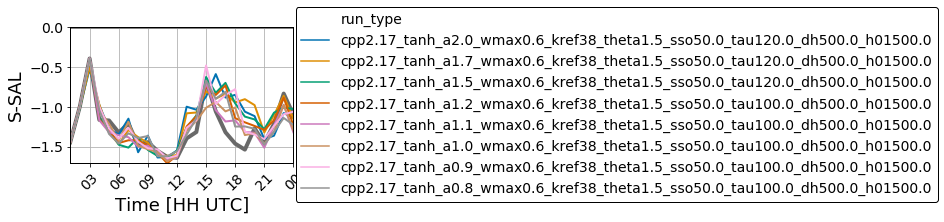

In [196]:
from matplotlib.dates import DateFormatter
#default_tau='deftau10min'
#sens_param='senstau'
#selected_run_list,line_kws, n_hues= get_run_selection(default_tau, sens_param, return_line_kws=True)

plt.figure(figsize=[4,2.5])
ref=  ['reference']
colors, linewidths = get_color_and_lw(ref, prec_arrays)
sns.lineplot(data=S_df, x = 'time', y = 'S-SAL', hue = 'run_type', 
             hue_order=ref, palette=colors, legend=False,
            size='run_type', size_order=ref, sizes = linewidths)

sns.lineplot(x = 'time', y = 'S-SAL',
             #style='kref',hue='$\\alpha_{cp}$',
             hue='run_type', 
             #hue ='$\\tau \\,[min]$',
             data = S_df[S_df['run_type'].isin(run_list[1:-1])], 
             palette=sns.color_palette("colorblind",8), #legend=False,
            linewidth=2)


#leg = plt.legend(loc='upper left' , ncol=1, fontsize=14)
#leg.get_frame().set_alpha(0.8)
leg = plt.legend(bbox_to_anchor=(1.01, 1.15), loc=2, borderaxespad=0.,)
plt.xticks(rotation=45)
plt.ylabel(r'S-SAL')
plt.xlabel('Time [HH UTC]')
plt.grid()
plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.hlines(0,min(S_df.time),max(S_df.time),colors='grey',linewidth=3)
#plt.title('threshold = %.1f mm/h'%(S_df.threshold_fcst[0]), fontsize='x-large')
plt.gca().autoscale(tight=True)

#### Cloud sizes...

In [67]:
from rdf_functions import identify_clouds, identify_clouds_2   
def make_cloud_ds(prec_arrays, radar_mask, water_kws=dict(water=False), prec_thres=(1.0,)):
    egg = prec_arrays.where(radar_mask).compute().to_array(dim='run',name='precipitation').stack(time_run=['time', 'run'])
    labels = egg.groupby('time_run').apply(identify_clouds_2, args =prec_thres, return_var = 'labels', **water_kws)
    cld_size = egg.groupby('time_run').apply(identify_clouds_2, args =prec_thres,return_var='cld_size',**water_kws)
    cld_sum = egg.groupby('time_run').apply(identify_clouds_2, args =prec_thres,return_var='cld_sum', **water_kws)

    cloud_ds=xr.Dataset()
    cloud_ds['labels']= labels
    cloud_ds['cloud_size']= cld_size
    cloud_ds['cloud_sum']= cld_sum
    #cloud_ds = cloud_ds.unstack('time_run')
    cloud_ds = cloud_ds.unstack().rename_dims({'time_run_level_0':'time', 'time_run_level_1':'run'})
    cloud_ds = cloud_ds.rename_vars({'time_run_level_0':'time', 'time_run_level_1':'run'})
    cloud_ds['#_of_clouds'] = (cloud_ds.cloud_size>0).sum('cloud_number')
    cloud_ds['cloud_radius'] = np.sqrt(cloud_ds.cloud_size / np.pi) / 1000  # in km
    cloud_ds.attrs=water_kws
    cloud_ds.attrs['prec_thres'] = 1.0
    return cloud_ds

water_kws= dict(water=True, neighborhood = 3)
prec_thres=(1.0,)
cloud_ds_sep = make_cloud_ds(prec_arrays, radar_mask, water_kws=water_kws, prec_thres=prec_thres)

In [68]:
egg = cloud_ds_sep[['#_of_clouds']]
egg['median_cloud_radii'] = cloud_ds_sep.cloud_radius.median('cloud_number')
egg['mean_cloud_radii'] = cloud_ds_sep.cloud_radius.mean('cloud_number')

cloud_df = egg.to_dataframe().reset_index()
cloud_df = cloud_df.rename(columns={'run':'run_type'})
#cloud_df = format_parameters(cloud_df)
cloud_df.describe()

,#_of_clouds,height_2m,wbt_13c,height_toa,height_10m,median_cloud_radii,mean_cloud_radii
count,216.000000,216.0,2.160000e+02,216.0,216.0,215.000000,215.000000
mean,261.439815,2.0,1.300001e+00,22000.0,10.0,3.764343,4.140709
std,119.524702,0.0,8.364034e-07,0.0,0.0,0.793980,0.737831
min,0.000000,2.0,1.300000e+00,22000.0,10.0,2.234077,3.022851
25%,214.750000,2.0,1.300000e+00,22000.0,10.0,3.159462,3.549785
50%,241.000000,2.0,1.300000e+00,22000.0,10.0,3.532386,3.983775
75%,321.000000,2.0,1.300000e+00,22000.0,10.0,4.179575,4.514342
max,533.000000,2.0,1.300000e+00,22000.0,10.0,6.607814,6.585970


In [69]:
water_kws= dict(water=False, neighborhood = 3)
prec_thres=(1.0,)
cloud_ds_nonsep = make_cloud_ds(prec_arrays, radar_mask, water_kws=water_kws, prec_thres=prec_thres)

In [70]:
egg = cloud_ds_nonsep[['#_of_clouds']]
egg['median_cloud_radii'] = cloud_ds_nonsep.cloud_radius.median('cloud_number')
egg['mean_cloud_radii'] = cloud_ds_nonsep.cloud_radius.mean('cloud_number')

cloud_df_nonsep = egg.to_dataframe().reset_index()
cloud_df_nonsep = cloud_df_nonsep.rename(columns={'run':'run_type'})
#cloud_df_nonsep = format_parameters(cloud_df_nonsep)
cloud_df_nonsep.describe()

,#_of_clouds,height_2m,wbt_13c,height_toa,height_10m,median_cloud_radii,mean_cloud_radii
count,216.000000,216.0,2.160000e+02,216.0,216.0,215.000000,215.000000
mean,173.810185,2.0,1.300001e+00,22000.0,10.0,3.658743,5.143383
std,84.349307,0.0,8.364034e-07,0.0,0.0,0.870807,1.306455
min,0.000000,2.0,1.300000e+00,22000.0,10.0,2.234077,3.605053
25%,122.750000,2.0,1.300000e+00,22000.0,10.0,3.159462,4.132296
50%,166.000000,2.0,1.300000e+00,22000.0,10.0,3.532386,4.802415
75%,202.500000,2.0,1.300000e+00,22000.0,10.0,4.179575,5.643394
max,352.000000,2.0,1.300000e+00,22000.0,10.0,6.885887,10.189733


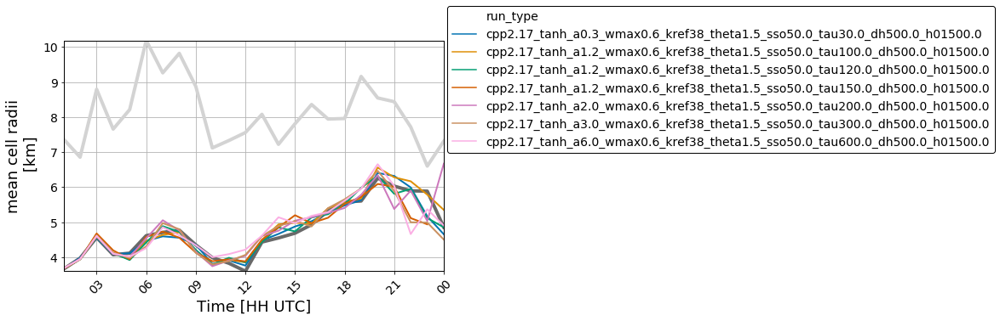

In [72]:
refrad_runs =  ['reference', 'radar']
colors, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
plt.figure(figsize=[8,5])
sns.lineplot(x = 'time', y = 'mean_cloud_radii', hue='run_type', data = cloud_df_nonsep, 
             hue_order=refrad_runs, legend=False,
            palette=colors, size='run_type', sizes= linewidths, size_order =refrad_runs)

sns.lineplot(x = 'time', y = 'mean_cloud_radii',
             #hue='$\\alpha_{cp}$',style='$w_{max} [m s^{-1}]$',
             hue='run_type',
             #style='$w_{max} [m s^{-1}]$',
            #hue='$\\alpha_{cp}$', size ='fixedH',
             data = cloud_df_nonsep[cloud_df_nonsep['run_type'].isin(run_list[1:-1])], 
             palette=sns.color_palette("colorblind",7),
            linewidth=2,)


#leg = plt.legend(loc='lower left' , ncol=1, fontsize='11.5')
#leg.get_frame().set_alpha(0.8)
leg = plt.legend(bbox_to_anchor=(1.01, 1.15), loc=2, borderaxespad=0.,)
plt.xticks(rotation=45)
#lt.ylabel(r'mediancloud size')
plt.xlabel('Time [HH UTC]')
plt.ylabel('mean cell radii\n [km]')
plt.grid()
plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)


In [ ]:
selected_run_list

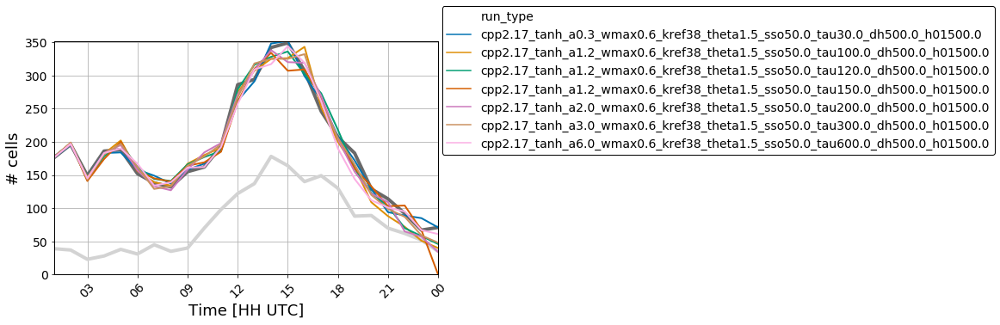

In [73]:

refrad_runs =  ['reference', 'radar']
colors, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
plt.figure(figsize=[8,5])
sns.lineplot(x = 'time', y = '#_of_clouds', hue='run_type', data = cloud_df_nonsep,
             hue_order=refrad_runs, legend=False,
            palette=colors, size='run_type', sizes= linewidths, size_order =refrad_runs)

sns.lineplot(x = 'time', y = '#_of_clouds',
             #hue='$\\alpha_{cp}$',style='$w_{max} [m s^{-1}]$',
             hue='run_type',
             #style='$w_{max} [m s^{-1}]$',
            #hue='$\\alpha_{cp}$', size ='fixedH',
             data = cloud_df_nonsep[cloud_df_nonsep['run_type'].isin(run_list[1:-1])], 
             palette=sns.color_palette("colorblind",7), 
             #legend=False,
            linewidth=2,)


#leg = plt.legend(loc='lower left' , ncol=1, fontsize='small')
#leg.get_frame().set_alpha(0.8)
leg = plt.legend(bbox_to_anchor=(1.01, 1.15), loc=2, borderaxespad=0.,)
plt.xticks(rotation=45)
plt.ylabel(r'# cells')
plt.xlabel('Time [HH UTC]')
plt.grid()
plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)


 now separated cells

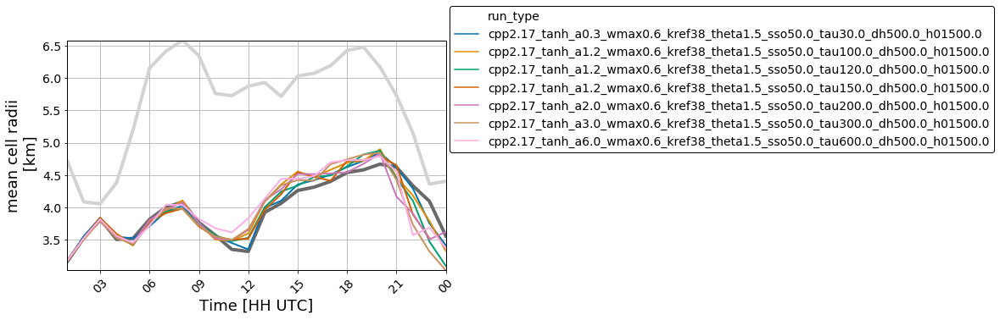

In [74]:
refrad_runs =  ['reference', 'radar']
colors, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
plt.figure(figsize=[8,5])
sns.lineplot(x = 'time', y = 'mean_cloud_radii', hue='run_type', data = cloud_df, 
             hue_order=refrad_runs, legend=False,
            palette=colors, size='run_type', sizes= linewidths, size_order =refrad_runs)

sns.lineplot(x = 'time', y = 'mean_cloud_radii',
             #hue='$\\alpha_{cp}$',style='$w_{max} [m s^{-1}]$',
             hue='run_type',
             #style='$w_{max} [m s^{-1}]$',
            #hue='$\\alpha_{cp}$', size ='fixedH',
             data = cloud_df[cloud_df['run_type'].isin(run_list[1:-1])], 
             palette=sns.color_palette("colorblind",7),
            linewidth=2,)


#leg = plt.legend(loc='lower left' , ncol=1, fontsize='11.5')
#leg.get_frame().set_alpha(0.8)
leg = plt.legend(bbox_to_anchor=(1.01, 1.15), loc=2, borderaxespad=0.,)
plt.xticks(rotation=45)
#lt.ylabel(r'mediancloud size')
plt.xlabel('Time [HH UTC]')
plt.ylabel('mean cell radii\n [km]')
plt.grid()
plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)


In [ ]:
selected_run_list

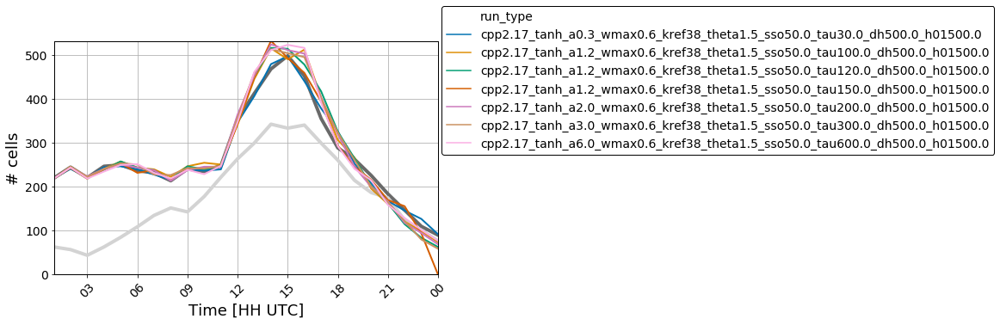

In [75]:

refrad_runs =  ['reference', 'radar']
colors, linewidths = get_color_and_lw(refrad_runs, prec_arrays)
plt.figure(figsize=[8,5])
sns.lineplot(x = 'time', y = '#_of_clouds', hue='run_type', data = cloud_df,
             hue_order=refrad_runs, legend=False,
            palette=colors, size='run_type', sizes= linewidths, size_order =refrad_runs)

sns.lineplot(x = 'time', y = '#_of_clouds',
             #hue='$\\alpha_{cp}$',style='$w_{max} [m s^{-1}]$',
             hue='run_type',
             #style='$w_{max} [m s^{-1}]$',
            #hue='$\\alpha_{cp}$', size ='fixedH',
             data = cloud_df[cloud_df['run_type'].isin(run_list[1:-1])], 
             palette=sns.color_palette("colorblind",7), 
             #legend=False,
            linewidth=2,)


#leg = plt.legend(loc='lower left' , ncol=1, fontsize='small')
#leg.get_frame().set_alpha(0.8)
leg = plt.legend(bbox_to_anchor=(1.01, 1.15), loc=2, borderaxespad=0.,)
plt.xticks(rotation=45)
plt.ylabel(r'# cells')
plt.xlabel('Time [HH UTC]')
plt.grid()
plt.gca().xaxis.set_major_formatter(DateFormatter("%H"))
plt.gca().autoscale(tight=True)
